In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 19.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 106.3 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 75.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.1 MB/s eta 0:00:00:00:0100:01
  Attempting uninst

In [3]:
import os
import numpy as np
import pandas as pd
import random
import cv2
import yaml
from tqdm import tqdm

import torch
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms

from sklearn.metrics import classification_report, confusion_matrix
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Import YOLOv8
from ultralytics import YOLO

# Set seeds for reproducibility
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed()

# Config
class Config:
    # Paths
    BASE_PATH = '/kaggle/input/7-defect-dataset'
    OUTPUT_PATH = '/kaggle/working'
   
    # Dataset settings
    IMG_SIZE = 640  # YOLO standard size
    BATCH_SIZE = 8
    NUM_WORKERS = 2
    PIN_MEMORY = True
   
    # Model settings
    NUM_CLASSES = 7  # 0-6 classes based on your dataset
    YOLO_MODEL = 'yolov8n.pt'  # Options: 'yolov8n.pt', 'yolov8s.pt', 'yolov8m.pt', 'yolov8l.pt', 'yolov8x.pt'
   
    # Training settings
    EPOCHS = 5  # Could be increased based on your resource availability
    PATIENCE = 3  # Early stopping patience
   
    # Augmentation settings
    STRONG_AUG = True

    # Class weights for handling imbalance
    USE_CLASS_WEIGHTS = True
   
    # Misc
    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    SAVE_MODEL = True
    CHECKPOINT_PATH = 'best_model.pt'
   
config = Config()

# Dataset preprocessing and analysis
def analyze_dataset(base_path):
    """Analyze the dataset and return statistics"""
    splits = ['train', 'test', 'valid']
    class_counts = {split: {i: 0 for i in range(config.NUM_CLASSES)} for split in splits}
    img_counts = {split: 0 for split in splits}
   
    # Process each split
    for split in splits:
        # Get labels directory
        labels_dir = os.path.join(base_path, split, 'labels')
        if not os.path.exists(labels_dir):
            print(f"Warning: {labels_dir} does not exist")
            continue
           
        # Process each label file
        for label_file in os.listdir(labels_dir):
            if not label_file.endswith('.txt'):
                continue
               
            img_counts[split] += 1
            label_path = os.path.join(labels_dir, label_file)
           
            # Read class labels
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    if parts:
                        class_id = int(float(parts[0]))
                        if 0 <= class_id < config.NUM_CLASSES:
                            class_counts[split][class_id] += 1
   
    # Create a pandas DataFrame for visualization
    data = []
    for split in splits:
        for class_id in range(config.NUM_CLASSES):
            data.append({
                'split': split,
                'class_id': class_id,
                'count': class_counts[split][class_id]
            })
   
    df = pd.DataFrame(data)
   
    # Calculate class weights to handle imbalance
    total_counts = df.groupby('class_id')['count'].sum().to_dict()
    total_samples = sum(total_counts.values())
    class_weights = {class_id: total_samples / (config.NUM_CLASSES * count) if count > 0 else 1.0
                     for class_id, count in total_counts.items()}
   
    return df, class_weights, img_counts

# Augmentations for validation (No augmentations needed for YOLOv8 training)
def get_val_transforms(img_size=640):
    """Generate validation augmentations (minimal)"""
    return A.Compose([
        A.Resize(height=img_size, width=img_size),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2(),
    ])

# Custom YOLO format dataset for validation and testing
class YOLODataset(Dataset):
    def __init__(self, base_path, split='train', transform=None):
        self.base_path = base_path
        self.split = split
        self.transform = transform
       
        self.images_dir = os.path.join(base_path, split, 'images')
        self.labels_dir = os.path.join(base_path, split, 'labels')
       
        self.image_files = [f for f in os.listdir(self.images_dir)
                           if f.endswith(('.jpg', '.jpeg', '.png'))]
       
        # Filter to include only images with corresponding label files
        self.valid_images = []
        self.class_counts = {i: 0 for i in range(config.NUM_CLASSES)}
       
        for img_file in self.image_files:
            base_name = os.path.splitext(img_file)[0]
            label_file = os.path.join(self.labels_dir, base_name + '.txt')
           
            if os.path.exists(label_file):
                # Read label file to check for valid classes
                with open(label_file, 'r') as f:
                    lines = f.readlines()
                    if not lines:  # Skip empty label files
                        continue
                   
                    # Extract classes and add to counts
                    valid = False
                    for line in lines:
                        parts = line.strip().split()
                        if parts:
                            class_id = int(float(parts[0]))
                            if 0 <= class_id < config.NUM_CLASSES:
                                self.class_counts[class_id] += 1
                                valid = True
                   
                    if valid:
                        self.valid_images.append((img_file, label_file))
   
    def __len__(self):
        return len(self.valid_images)
   
    def __getitem__(self, idx):
        img_file, label_file = self.valid_images[idx]
        img_path = os.path.join(self.images_dir, img_file)
       
        # Read image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
       
        # Get original image dimensions
        height, width = img.shape[:2]
       
        # Read labels
        with open(label_file, 'r') as f:
            lines = f.readlines()
       
        # Initialize targets
        boxes = []
        labels = []
       
        # Parse YOLO format
        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:  # class_id, x_center, y_center, w, h
                class_id = int(float(parts[0]))
               
                # Skip invalid classes
                if class_id >= config.NUM_CLASSES:
                    continue
                   
                # YOLO format: center_x, center_y, width, height (normalized)
                x_center = float(parts[1])
                y_center = float(parts[2])
                w = float(parts[3])
                h = float(parts[4])
               
                # Convert to absolute coordinates for augmentation
                x_min = (x_center - w/2) * width
                y_min = (y_center - h/2) * height
                x_max = (x_center + w/2) * width
                y_max = (y_center + h/2) * height
               
                boxes.append([x_min, y_min, x_max, y_max])
                labels.append(class_id)
       
        # Convert to numpy arrays
        boxes = np.array(boxes, dtype=np.float32)
        labels = np.array(labels, dtype=np.int64)
       
        # Apply transformations
        if self.transform and len(boxes) > 0:
            transformed = self.transform(image=img, bboxes=boxes, class_labels=labels)
            img = transformed['image']
            boxes = np.array(transformed['bboxes'], dtype=np.float32) if len(transformed['bboxes']) > 0 else np.zeros((0, 4), dtype=np.float32)
            labels = np.array(transformed['class_labels'], dtype=np.int64) if len(transformed['class_labels']) > 0 else np.array([], dtype=np.int64)
        else:
            # If no valid boxes or no transform, just transform the image
            if self.transform:
                transformed = self.transform(image=img)
                img = transformed['image']
            else:
                # Convert to torch tensor if no transform
                img = torch.from_numpy(img.transpose(2, 0, 1)).float() / 255.0
       
        # Create target dictionary
        target = {
            'boxes': torch.from_numpy(boxes) if len(boxes) > 0 else torch.zeros((0, 4)),
            'labels': torch.from_numpy(labels) if len(labels) > 0 else torch.zeros(0, dtype=torch.int64),
            'image_id': torch.tensor([idx]),
            'area': torch.tensor([(x2 - x1) * (y2 - y1) for x1, y1, x2, y2 in boxes]) if len(boxes) > 0 else torch.zeros(0),
            'iscrowd': torch.zeros((len(boxes),), dtype=torch.int64) if len(boxes) > 0 else torch.zeros(0, dtype=torch.int64)
        }
       
        return img, target, img_file

# Prepare YOLO dataset in the format required by YOLOv8
def prepare_yolo_dataset(base_path, output_path):
    """Create dataset.yaml file for YOLOv8 training"""
    # Create dataset.yaml file
    dataset_yaml = {
        'path': base_path,
        'train': f'{base_path}/train/images',
        'val': f'{base_path}/valid/images',
        'test': f'{base_path}/test/images',
        'nc': config.NUM_CLASSES,
        'names': {i: f"class_{i}" for i in range(config.NUM_CLASSES)}
    }
   
    # Write to file
    os.makedirs(output_path, exist_ok=True)
    with open(os.path.join(output_path, 'dataset.yaml'), 'w') as f:
        yaml.dump(dataset_yaml, f)
   
    return os.path.join(output_path, 'dataset.yaml')

# Calculate mAP for object detection
def calculate_map(predictions, targets, iou_threshold=0.5):
    """Calculate mean Average Precision with better handling of edge cases"""
    # Handle empty predictions or targets
    if not predictions or not targets:
        return 0.0
   
    # Calculate IoU between two boxes
    def calculate_iou(box1, box2):
        # box format: [x1, y1, x2, y2]
        x1 = max(box1[0], box2[0])
        y1 = max(box1[1], box2[1])
        x2 = min(box1[2], box2[2])
        y2 = min(box1[3], box2[3])
       
        # Calculate intersection area
        intersection = max(0, x2 - x1) * max(0, y2 - y1)
       
        # Calculate union area
        box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
        box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
        union = box1_area + box2_area - intersection
       
        # Calculate IoU
        iou = intersection / union if union > 0 else 0
       
        return iou
   
    # Calculate AP for each class
    aps = []
   
    for class_id in range(config.NUM_CLASSES):
        # Get predictions and targets for this class
        class_preds = []
        class_targets = []
       
        for i in range(len(predictions)):
            pred = predictions[i]
            targ = targets[i]
           
            # Get predictions for this class
            pred_indices = np.where(pred['labels'] == class_id)[0]
            pred_boxes = pred['boxes'][pred_indices]
            pred_scores = pred['scores'][pred_indices]
           
            # Skip if no predictions for this class
            if len(pred_boxes) == 0:
                continue
               
            # Sort by confidence
            sort_indices = np.argsort(-pred_scores)
            pred_boxes = pred_boxes[sort_indices]
            pred_scores = pred_scores[sort_indices]
           
            # Get targets for this class
            targ_indices = np.where(targ['labels'] == class_id)[0]
            targ_boxes = targ['boxes'][targ_indices]
           
            class_preds.append({
                'boxes': pred_boxes,
                'scores': pred_scores
            })
            class_targets.append({
                'boxes': targ_boxes
            })
       
        # Skip if no predictions or targets for this class
        if not class_preds or not class_targets:
            continue
           
        # Calculate precision and recall
        tp = []
        fp = []
        n_positives = sum(len(t['boxes']) for t in class_targets)
       
        # Skip if no ground truth positives
        if n_positives == 0:
            continue
           
        for i in range(len(class_preds)):
            pred_boxes = class_preds[i]['boxes']
            pred_scores = class_preds[i]['scores']
            targ_boxes = class_targets[i]['boxes']
           
            # Mark targets as used once matched
            used_targets = [False] * len(targ_boxes)
           
            for j in range(len(pred_boxes)):
                # If no targets, all predictions are false positives
                if len(targ_boxes) == 0:
                    tp.append(0)
                    fp.append(1)
                    continue
               
                # Find best matching target
                best_iou = -1
                best_idx = -1
               
                for k in range(len(targ_boxes)):
                    if used_targets[k]:
                        continue
                   
                    iou = calculate_iou(pred_boxes[j], targ_boxes[k])
                   
                    if iou > best_iou:
                        best_iou = iou
                        best_idx = k
               
                # Check if match is good enough
                if best_iou >= iou_threshold and best_idx >= 0:
                    used_targets[best_idx] = True
                    tp.append(1)
                    fp.append(0)
                else:
                    tp.append(0)
                    fp.append(1)
       
        # Skip if no true positives or false positives
        if not tp or not fp:
            continue
           
        # Calculate cumulative TP and FP
        cum_tp = np.cumsum(tp)
        cum_fp = np.cumsum(fp)
       
        # Calculate precision and recall
        precision = cum_tp / (cum_tp + cum_fp + 1e-10)
        recall = cum_tp / (n_positives + 1e-10)
       
        # Calculate AP using 11-point interpolation
        ap = 0
       
        for t in np.arange(0, 1.1, 0.1):
            # Skip if no recall points exceed threshold
            if np.sum(recall >= t) == 0:
                p = 0
            else:
                p = np.max(precision[recall >= t])
            ap += p / 11
       
        aps.append(ap)
   
    # Calculate mAP
    mAP = np.mean(aps) if aps else 0
   
    return mAP

# Convert YOLOv8 predictions to format compatible with our evaluation
def convert_yolo_predictions(results, confidence_threshold=0.25):
    """Convert YOLOv8 predictions to a format compatible with our mAP calculation"""
    predictions = []
   
    for result in results:
        boxes = []
        scores = []
        labels = []
       
        if result.boxes.xyxy.numel() > 0:  # check if there are any detections
            # Get boxes in [x1, y1, x2, y2] format
            boxes_xyxy = result.boxes.xyxy.cpu().numpy()
            # Get confidence scores
            conf = result.boxes.conf.cpu().numpy()
            # Get class labels
            cls = result.boxes.cls.cpu().numpy().astype(int)
           
            # Filter by confidence
            mask = conf >= confidence_threshold
            boxes.append(boxes_xyxy[mask])
            scores.append(conf[mask])
            labels.append(cls[mask])
       
        if len(boxes) > 0 and len(boxes[0]) > 0:
            predictions.append({
                'boxes': np.vstack(boxes),
                'scores': np.concatenate(scores),
                'labels': np.concatenate(labels)
            })
        else:
            # Empty prediction
            predictions.append({
                'boxes': np.array([]),
                'scores': np.array([]),
                'labels': np.array([])
            })
   
    return predictions

# Main function to run the training pipeline
def main():
    # Analyze dataset
    print("Analyzing dataset...")
    df, class_weights, img_counts = analyze_dataset(config.BASE_PATH)
   
    # Print dataset statistics
    print("\nDataset Statistics:")
    for split, count in img_counts.items():
        print(f"  {split}: {count} images")
   
    print("\nClass distribution:")
    for class_id, counts in df.groupby('class_id')['count'].sum().items():
        print(f"  Class {class_id}: {counts} instances")
   
    # Prepare YAML file for YOLOv8
    dataset_yaml = prepare_yolo_dataset(config.BASE_PATH, config.OUTPUT_PATH)
    print(f"\nYOLO dataset configuration prepared: {dataset_yaml}")
   
    # Initialize YOLOv8 model
    print("\nInitializing YOLOv8 model...")
    model = YOLO(config.YOLO_MODEL)
   
    # Train YOLOv8 model
    print("\nTraining YOLOv8 model...")
    results = model.train(
        data=dataset_yaml,
        epochs=config.EPOCHS,
        imgsz=config.IMG_SIZE,
        batch=config.BATCH_SIZE,
        patience=config.PATIENCE,
        device=0 if torch.cuda.is_available() else 'cpu',
        project=config.OUTPUT_PATH,
        name='yolov8_training',
        save=True
    )
   
    # Get best model path
    training_dir = os.path.join(config.OUTPUT_PATH, 'yolov8_training')
    if os.path.exists(os.path.join(training_dir, 'weights', 'best.pt')):
        best_model_path = os.path.join(training_dir, 'weights', 'best.pt')
    elif os.path.exists(os.path.join(config.OUTPUT_PATH, 'yolov8_training2', 'weights', 'best.pt')):
        best_model_path = os.path.join(config.OUTPUT_PATH, 'yolov8_training2', 'weights', 'best.pt')
    else:
        # Look for any best.pt file in the output path and its subdirectories
        best_model_candidates = []
        for root, dirs, files in os.walk(config.OUTPUT_PATH):
            if 'best.pt' in files:
                best_model_candidates.append(os.path.join(root, 'best.pt'))
       
        if best_model_candidates:
            # Use the most recently modified best.pt file
            best_model_path = max(best_model_candidates, key=os.path.getmtime)
        else:
            # If no best.pt found, use the last.pt file instead
            last_pt_candidates = []
            for root, dirs, files in os.walk(config.OUTPUT_PATH):
                if 'last.pt' in files:
                    last_pt_candidates.append(os.path.join(root, 'last.pt'))
           
            if last_pt_candidates:
                best_model_path = max(last_pt_candidates, key=os.path.getmtime)
            else:
                raise FileNotFoundError("Could not find best.pt or last.pt in the output directory")
   
    # Create validation dataset for manual evaluation
    val_transform = get_val_transforms(config.IMG_SIZE)
    val_dataset = YOLODataset(config.BASE_PATH, split='valid', transform=val_transform)
    val_loader = DataLoader(
        val_dataset,
        batch_size=config.BATCH_SIZE,
        shuffle=False,
        num_workers=config.NUM_WORKERS,
        collate_fn=lambda batch: tuple(zip(*batch)),
        pin_memory=config.PIN_MEMORY
    )
   
    # Evaluate on validation set with our custom mAP calculation
    print("\nEvaluating on validation set...")
   
    # Load the best model
    best_model = YOLO(best_model_path)
   
    # Run inference on validation set
    all_predictions = []
    all_targets = []
   
    for images, targets, img_files in tqdm(val_loader, desc="Validating"):
        # Convert images to paths for YOLOv8 inference
        img_paths = [os.path.join(config.BASE_PATH, 'valid', 'images', img_file) for img_file in img_files]
       
        # Run inference
        results = best_model(img_paths)
       
        # Convert YOLOv8 predictions to our format
        predictions = convert_yolo_predictions(results)
       
        # Store predictions and targets
        all_predictions.extend(predictions)
        all_targets.extend([{
            'boxes': target['boxes'].numpy() if len(target['boxes']) > 0 else np.array([]),
            'labels': target['labels'].numpy() if len(target['labels']) > 0 else np.array([])
        } for target in targets])
   
    # Calculate validation mAP
    val_mAP = calculate_map(all_predictions, all_targets, iou_threshold=0.5)
    print(f"Validation mAP: {val_mAP:.4f}")
   
    # Test on test dataset
    print("\nEvaluating on test dataset...")
    test_dataset = YOLODataset(config.BASE_PATH, split='test', transform=val_transform)
    test_loader = DataLoader(
        test_dataset,
        batch_size=config.BATCH_SIZE,
        shuffle=False,
        num_workers=config.NUM_WORKERS,
        collate_fn=lambda batch: tuple(zip(*batch)),
        pin_memory=config.PIN_MEMORY
    )
   
    # Run inference on test set
    all_predictions = []
    all_targets = []
   
    for images, targets, img_files in tqdm(test_loader, desc="Testing"):
        # Convert images to paths for YOLOv8 inference
        img_paths = [os.path.join(config.BASE_PATH, 'test', 'images', img_file) for img_file in img_files]
       
        # Run inference
        results = best_model(img_paths)
       
        # Convert YOLOv8 predictions to our format
        predictions = convert_yolo_predictions(results)
       
        # Store predictions and targets
        all_predictions.extend(predictions)
        all_targets.extend([{
            'boxes': target['boxes'].numpy() if len(target['boxes']) > 0 else np.array([]),
            'labels': target['labels'].numpy() if len(target['labels']) > 0 else np.array([])
        } for target in targets])
   
    # Calculate test mAP
    test_mAP = calculate_map(all_predictions, all_targets, iou_threshold=0.5)
    print(f"Test mAP: {test_mAP:.4f}")
   
    # Save results to YAML file
    results_data = {
        'metrics': {
            'val_mAP': float(val_mAP),
            'test_mAP': float(test_mAP)
        },
        'config': {
            'img_size': config.IMG_SIZE,
            'batch_size': config.BATCH_SIZE,
            'epochs': config.EPOCHS,
            'yolo_model': config.YOLO_MODEL,
            'strong_aug': config.STRONG_AUG
        },
        'best_model_path': best_model_path
    }
   
    with open(os.path.join(config.OUTPUT_PATH, 'results.yaml'), 'w') as f:
        yaml.dump(results_data, f)
   
    print("\nTraining completed!")
    print(f"Best model saved to {best_model_path}")
    print(f"Results saved to {os.path.join(config.OUTPUT_PATH, 'results.yaml')}")

# Run the main function
if __name__ == "__main__":
    main()

Analyzing dataset...

Dataset Statistics:
  train: 1950 images
  test: 280 images
  valid: 562 images

Class distribution:
  Class 0: 348 instances
  Class 1: 283 instances
  Class 2: 241 instances
  Class 3: 495 instances
  Class 4: 468 instances
  Class 5: 600 instances
  Class 6: 1428 instances

YOLO dataset configuration prepared: /kaggle/working/dataset.yaml

Initializing YOLOv8 model...

Training YOLOv8 model...
Ultralytics 8.3.193 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=N

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        562        786      0.473       0.41       0.43      0.202
               class_0         48         79      0.571      0.354      0.353      0.176
               class_1         15         30      0.137     0.0667     0.0529     0.0153
               class_2         53         55      0.629      0.855       0.85      0.359
               class_3         75        102      0.561      0.339      0.449      0.193
               class_4         63         87      0.379      0.494      0.491      0.292
               class_5         64        121      0.382      0.215      0.205     0.0754
               class_6        208        312      0.652      0.545      0.608      0.301
Speed: 0.1ms preprocess, 1.7ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to /kaggle/working/yolov8_training2

Evaluating on validation set...


Validating:   0%|          | 0/66 [00:00<?, ?it/s]


0: 640x640 (no detections), 5.5ms
1: 640x640 4 class_5s, 5.5ms
2: 640x640 3 class_6s, 5.5ms
3: 640x640 (no detections), 5.5ms
4: 640x640 3 class_2s, 5.5ms
5: 640x640 (no detections), 5.5ms
6: 640x640 1 class_6, 5.5ms
7: 640x640 1 class_2, 1 class_6, 5.5ms
Speed: 3.3ms preprocess, 5.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Validating:   2%|▏         | 1/66 [00:01<01:09,  1.07s/it]


0: 640x640 2 class_6s, 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 2 class_2s, 4.9ms
3: 640x640 4 class_4s, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 2 class_6s, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:   3%|▎         | 2/66 [00:01<00:46,  1.38it/s]


0: 640x640 2 class_4s, 4.9ms
1: 640x640 3 class_5s, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 1 class_2, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 2 class_3s, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 1 class_2, 1 class_3, 1 class_4, 4.9ms
Speed: 2.9ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:   5%|▍         | 3/66 [00:01<00:30,  2.04it/s]


0: 640x640 2 class_6s, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 3 class_6s, 4.9ms
3: 640x640 2 class_6s, 4.9ms
4: 640x640 4 class_6s, 4.9ms
5: 640x640 1 class_0, 1 class_6, 4.9ms
6: 640x640 5 class_5s, 4.9ms
7: 640x640 1 class_2, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Validating:   6%|▌         | 4/66 [00:01<00:23,  2.59it/s]


0: 640x640 2 class_2s, 1 class_5, 4.9ms
1: 640x640 1 class_2, 4.9ms
2: 640x640 2 class_6s, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 3 class_6s, 4.9ms
5: 640x640 2 class_4s, 4.9ms
6: 640x640 1 class_5, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:   8%|▊         | 5/66 [00:02<00:21,  2.90it/s]


0: 640x640 5 class_2s, 4.9ms
1: 640x640 1 class_3, 4.9ms
2: 640x640 1 class_4, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 1 class_4, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 1 class_5, 4.9ms
7: 640x640 2 class_2s, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:   9%|▉         | 6/66 [00:02<00:18,  3.29it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 1 class_2, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 1 class_0, 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Validating:  11%|█         | 7/66 [00:02<00:16,  3.64it/s]


0: 640x640 4 class_6s, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 3 class_2s, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_0, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 1 class_3, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Validating:  12%|█▏        | 8/66 [00:02<00:15,  3.78it/s]


0: 640x640 2 class_5s, 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 1 class_3, 4.9ms
3: 640x640 3 class_4s, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 2 class_3s, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 2 class_4s, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  14%|█▎        | 9/66 [00:03<00:16,  3.49it/s]


0: 640x640 1 class_5, 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 2 class_2s, 4.9ms
4: 640x640 3 class_6s, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 2 class_3s, 4.9ms
7: 640x640 3 class_6s, 4.9ms
Speed: 2.8ms preprocess, 4.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Validating:  15%|█▌        | 10/66 [00:03<00:14,  3.74it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 2 class_0s, 4.9ms
3: 640x640 1 class_0, 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 4 class_6s, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 3.2ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  17%|█▋        | 11/66 [00:03<00:14,  3.80it/s]


0: 640x640 1 class_2, 4.9ms
1: 640x640 5 class_5s, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 2 class_2s, 4.9ms
4: 640x640 2 class_2s, 4.9ms
5: 640x640 2 class_2s, 1 class_6, 4.9ms
6: 640x640 1 class_3, 4.9ms
7: 640x640 3 class_0s, 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Validating:  18%|█▊        | 12/66 [00:03<00:12,  4.18it/s]


0: 640x640 1 class_2, 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 2 class_2s, 4.9ms
5: 640x640 1 class_2, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.8ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  20%|█▉        | 13/66 [00:04<00:12,  4.34it/s]


0: 640x640 2 class_4s, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 1 class_2, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 2 class_2s, 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 3 class_3s, 4.9ms
Speed: 3.6ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  21%|██        | 14/66 [00:04<00:12,  4.22it/s]


0: 640x640 3 class_3s, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 1 class_3, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 4 class_6s, 4.9ms
5: 640x640 6 class_6s, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 5 class_5s, 4.9ms
Speed: 2.3ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  23%|██▎       | 15/66 [00:04<00:12,  4.18it/s]


0: 640x640 1 class_4, 4.9ms
1: 640x640 3 class_6s, 4.9ms
2: 640x640 5 class_4s, 4.9ms
3: 640x640 2 class_6s, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 2 class_2s, 4.9ms
7: 640x640 1 class_2, 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Validating:  24%|██▍       | 16/66 [00:05<00:15,  3.19it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 2 class_6s, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 3 class_4s, 4.9ms
5: 640x640 3 class_6s, 4.9ms
6: 640x640 2 class_5s, 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 3.4ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  26%|██▌       | 17/66 [00:05<00:13,  3.70it/s]


0: 640x640 2 class_6s, 4.9ms
1: 640x640 1 class_3, 4.9ms
2: 640x640 2 class_4s, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 4 class_6s, 4.9ms
Speed: 3.4ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  27%|██▋       | 18/66 [00:05<00:12,  3.76it/s]


0: 640x640 1 class_0, 4.9ms
1: 640x640 1 class_2, 4.9ms
2: 640x640 3 class_4s, 4.9ms
3: 640x640 2 class_6s, 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 2 class_6s, 4.9ms
6: 640x640 4 class_5s, 4.9ms
7: 640x640 4 class_2s, 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Validating:  29%|██▉       | 19/66 [00:05<00:11,  4.22it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 5 class_6s, 4.9ms
3: 640x640 1 class_0, 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 2 class_3s, 4.9ms
6: 640x640 1 class_0, 2 class_3s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  30%|███       | 20/66 [00:05<00:10,  4.22it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 3 class_4s, 4.9ms
3: 640x640 2 class_6s, 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 1 class_2, 4.9ms
6: 640x640 3 class_2s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  32%|███▏      | 21/66 [00:06<00:12,  3.71it/s]


0: 640x640 1 class_0, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 2 class_6s, 4.9ms
3: 640x640 1 class_3, 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 1 class_2, 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  33%|███▎      | 22/66 [00:06<00:11,  3.79it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 2 class_2s, 4.9ms
5: 640x640 4 class_6s, 4.9ms
6: 640x640 3 class_6s, 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 2.2ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  35%|███▍      | 23/66 [00:06<00:10,  4.21it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 3 class_2s, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 4 class_6s, 4.9ms
5: 640x640 2 class_6s, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  36%|███▋      | 24/66 [00:06<00:09,  4.29it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_4, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 1 class_3, 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 2.7ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  38%|███▊      | 25/66 [00:07<00:09,  4.30it/s]


0: 640x640 2 class_6s, 4.9ms
1: 640x640 1 class_3, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 3 class_5s, 4.9ms
4: 640x640 1 class_3, 4.9ms
5: 640x640 5 class_6s, 4.9ms
6: 640x640 2 class_2s, 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Validating:  39%|███▉      | 26/66 [00:07<00:09,  4.39it/s]


0: 640x640 2 class_4s, 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 1 class_2, 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 3 class_3s, 4.9ms
7: 640x640 1 class_4, 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  41%|████      | 27/66 [00:07<00:10,  3.66it/s]


0: 640x640 1 class_4, 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 4 class_4s, 4.9ms
3: 640x640 3 class_4s, 4.9ms
4: 640x640 1 class_2, 4.9ms
5: 640x640 1 class_2, 4.9ms
6: 640x640 1 class_4, 4.9ms
7: 640x640 2 class_2s, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Validating:  42%|████▏     | 28/66 [00:08<00:12,  3.07it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 3 class_5s, 4.9ms
3: 640x640 5 class_5s, 4.9ms
4: 640x640 1 class_3, 4.9ms
5: 640x640 6 class_4s, 4.9ms
6: 640x640 2 class_2s, 4.9ms
7: 640x640 2 class_3s, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  44%|████▍     | 29/66 [00:08<00:12,  2.87it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 1 class_2, 4.9ms
2: 640x640 1 class_3, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 4 class_5s, 4.9ms
5: 640x640 1 class_3, 4.9ms
6: 640x640 2 class_4s, 4.9ms
7: 640x640 3 class_1s, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  45%|████▌     | 30/66 [00:08<00:11,  3.15it/s]


0: 640x640 1 class_2, 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 1 class_2, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 3 class_6s, 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 5 class_6s, 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 2.3ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  47%|████▋     | 31/66 [00:09<00:09,  3.71it/s]


0: 640x640 4 class_4s, 4.9ms
1: 640x640 2 class_4s, 4.9ms
2: 640x640 2 class_6s, 4.9ms
3: 640x640 2 class_6s, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 1 class_0, 4.9ms
6: 640x640 4 class_5s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 3.2ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  48%|████▊     | 32/66 [00:09<00:08,  3.84it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 4 class_6s, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_3, 4.9ms
6: 640x640 2 class_5s, 4.9ms
7: 640x640 7 class_1s, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  50%|█████     | 33/66 [00:09<00:08,  3.88it/s]


0: 640x640 2 class_2s, 4.9ms
1: 640x640 1 class_0, 4.9ms
2: 640x640 3 class_4s, 4.9ms
3: 640x640 1 class_4, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 1 class_3, 4.9ms
6: 640x640 1 class_3, 4.9ms
7: 640x640 2 class_2s, 4.9ms
Speed: 2.3ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  52%|█████▏    | 34/66 [00:09<00:08,  3.99it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 2 class_4s, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_3, 4.9ms
6: 640x640 2 class_0s, 4.9ms
7: 640x640 2 class_0s, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  53%|█████▎    | 35/66 [00:09<00:07,  4.06it/s]


0: 640x640 1 class_3, 4.9ms
1: 640x640 4 class_4s, 4.9ms
2: 640x640 4 class_6s, 4.9ms
3: 640x640 2 class_6s, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 1 class_0, 4.9ms
6: 640x640 9 class_1s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.7ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  55%|█████▍    | 36/66 [00:10<00:07,  4.10it/s]


0: 640x640 3 class_6s, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 2 class_3s, 4.9ms
3: 640x640 2 class_6s, 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 1 class_0, 4.9ms
6: 640x640 3 class_6s, 4.9ms
7: 640x640 2 class_0s, 4.9ms
Speed: 3.5ms preprocess, 4.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Validating:  56%|█████▌    | 37/66 [00:10<00:07,  3.99it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_2, 1 class_6, 4.9ms
2: 640x640 1 class_2, 4.9ms
3: 640x640 1 class_2, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 6 class_5s, 4.9ms
6: 640x640 4 class_3s, 4.9ms
7: 640x640 1 class_2, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  58%|█████▊    | 38/66 [00:10<00:06,  4.49it/s]


0: 640x640 4 class_4s, 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 6 class_3s, 4.9ms
5: 640x640 4 class_5s, 4.9ms
6: 640x640 3 class_6s, 4.9ms
7: 640x640 1 class_2, 1 class_6, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  59%|█████▉    | 39/66 [00:10<00:06,  4.35it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 4 class_6s, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 5 class_4s, 4.9ms
4: 640x640 4 class_1s, 4.9ms
5: 640x640 1 class_3, 4.9ms
6: 640x640 2 class_3s, 4.9ms
7: 640x640 1 class_3, 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  61%|██████    | 40/66 [00:11<00:06,  4.08it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 1 class_0, 4.9ms
4: 640x640 2 class_0s, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 2 class_0s, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  62%|██████▏   | 41/66 [00:11<00:05,  4.26it/s]


0: 640x640 1 class_0, 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 2 class_6s, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  64%|██████▎   | 42/66 [00:11<00:05,  4.26it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 1 class_3, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_3, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 3.0ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  65%|██████▌   | 43/66 [00:11<00:05,  4.30it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_0, 4.9ms
2: 640x640 1 class_2, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 2 class_4s, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Validating:  67%|██████▋   | 44/66 [00:12<00:05,  4.26it/s]


0: 640x640 1 class_2, 4.9ms
1: 640x640 1 class_5, 4.9ms
2: 640x640 3 class_3s, 1 class_4, 4.9ms
3: 640x640 1 class_5, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 2 class_4s, 4.9ms
7: 640x640 3 class_6s, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Validating:  68%|██████▊   | 45/66 [00:12<00:04,  4.66it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 2 class_0s, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 1 class_0, 1 class_6, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.2ms preprocess, 4.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Validating:  70%|██████▉   | 46/66 [00:12<00:04,  4.74it/s]


0: 640x640 5 class_4s, 4.9ms
1: 640x640 2 class_5s, 4.9ms
2: 640x640 2 class_6s, 4.9ms
3: 640x640 2 class_6s, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_3, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 2 class_0s, 4.9ms
Speed: 2.2ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  71%|███████   | 47/66 [00:12<00:03,  5.06it/s]


0: 640x640 2 class_6s, 4.9ms
1: 640x640 1 class_0, 4.9ms
2: 640x640 1 class_3, 4.9ms
3: 640x640 1 class_4, 4.9ms
4: 640x640 2 class_2s, 4.9ms
5: 640x640 2 class_3s, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 2 class_4s, 4.9ms
Speed: 3.4ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  73%|███████▎  | 48/66 [00:13<00:04,  4.04it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 1 class_2, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 5 class_5s, 4.9ms
5: 640x640 2 class_4s, 4.9ms
6: 640x640 4 class_4s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  74%|███████▍  | 49/66 [00:13<00:04,  3.46it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 3 class_4s, 4.9ms
2: 640x640 5 class_3s, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 3 class_5s, 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 1 class_2, 1 class_6, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.9ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  76%|███████▌  | 50/66 [00:13<00:05,  2.86it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 2 class_0s, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 1 class_0, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.3ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  77%|███████▋  | 51/66 [00:14<00:04,  3.28it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 1 class_0, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 4 class_4s, 4.9ms
7: 640x640 1 class_5, 1 class_6, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  79%|███████▉  | 52/66 [00:14<00:04,  3.15it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 2 class_6s, 4.9ms
3: 640x640 1 class_2, 4.9ms
4: 640x640 3 class_0s, 4.9ms
5: 640x640 5 class_6s, 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  80%|████████  | 53/66 [00:14<00:03,  3.66it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_2, 4.9ms
2: 640x640 2 class_6s, 4.9ms
3: 640x640 1 class_4, 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 4 class_5s, 4.9ms
7: 640x640 1 class_3, 4.9ms
Speed: 3.0ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  82%|████████▏ | 54/66 [00:14<00:03,  3.61it/s]


0: 640x640 2 class_6s, 4.9ms
1: 640x640 3 class_6s, 4.9ms
2: 640x640 4 class_6s, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 1 class_3, 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Validating:  83%|████████▎ | 55/66 [00:15<00:02,  3.98it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 2 class_0s, 4.9ms
3: 640x640 3 class_0s, 4.9ms
4: 640x640 1 class_2, 4.9ms
5: 640x640 1 class_0, 4.9ms
6: 640x640 6 class_5s, 4.9ms
7: 640x640 4 class_6s, 4.9ms
Speed: 2.7ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  85%|████████▍ | 56/66 [00:15<00:02,  3.68it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 5 class_4s, 4.9ms
3: 640x640 4 class_3s, 4.9ms
4: 640x640 4 class_6s, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  86%|████████▋ | 57/66 [00:15<00:02,  3.24it/s]


0: 640x640 2 class_2s, 4.9ms
1: 640x640 6 class_6s, 4.9ms
2: 640x640 4 class_6s, 4.9ms
3: 640x640 1 class_0, 1 class_6, 4.9ms
4: 640x640 4 class_4s, 4.9ms
5: 640x640 1 class_0, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  88%|████████▊ | 58/66 [00:16<00:02,  3.20it/s]


0: 640x640 3 class_4s, 4.9ms
1: 640x640 2 class_4s, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 3 class_4s, 4.9ms
4: 640x640 3 class_4s, 4.9ms
5: 640x640 3 class_3s, 4.9ms
6: 640x640 1 class_0, 1 class_5, 4.9ms
7: 640x640 1 class_2, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  89%|████████▉ | 59/66 [00:16<00:02,  2.69it/s]


0: 640x640 1 class_3, 1 class_6, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 2 class_3s, 4.9ms
3: 640x640 1 class_2, 4.9ms
4: 640x640 1 class_3, 4.9ms
5: 640x640 4 class_6s, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Validating:  91%|█████████ | 60/66 [00:16<00:01,  3.10it/s]


0: 640x640 2 class_3s, 1 class_4, 1 class_6, 4.9ms
1: 640x640 3 class_5s, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 1 class_0, 1 class_5, 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 2.7ms preprocess, 4.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Validating:  92%|█████████▏| 61/66 [00:17<00:01,  3.32it/s]


0: 640x640 3 class_5s, 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 2 class_6s, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 2 class_0s, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  94%|█████████▍| 62/66 [00:17<00:01,  3.56it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 2 class_3s, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 1 class_3, 4.9ms
6: 640x640 1 class_5, 4.9ms
7: 640x640 1 class_5, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating:  95%|█████████▌| 63/66 [00:17<00:00,  3.97it/s]


0: 640x640 3 class_6s, 4.9ms
1: 640x640 2 class_3s, 4.9ms
2: 640x640 1 class_4, 4.9ms
3: 640x640 3 class_6s, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.3ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  97%|█████████▋| 64/66 [00:17<00:00,  4.25it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 2 class_2s, 4.9ms
2: 640x640 1 class_0, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 1 class_4, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Validating:  98%|█████████▊| 65/66 [00:18<00:00,  3.83it/s]


0: 640x640 1 class_6, 8.7ms
1: 640x640 2 class_0s, 8.7ms
2: 640x640 2 class_6s, 8.7ms
3: 640x640 (no detections), 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Validating: 100%|██████████| 66/66 [00:18<00:00,  3.63it/s]


Validation mAP: 0.3201

Evaluating on test dataset...


Testing:   0%|          | 0/33 [00:00<?, ?it/s]


0: 640x640 1 class_4, 5.1ms
1: 640x640 1 class_6, 5.1ms
2: 640x640 3 class_3s, 5.1ms
3: 640x640 1 class_6, 5.1ms
4: 640x640 1 class_6, 5.1ms
5: 640x640 1 class_6, 5.1ms
6: 640x640 2 class_4s, 5.1ms
7: 640x640 3 class_6s, 5.1ms
Speed: 2.6ms preprocess, 5.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Testing:   3%|▎         | 1/33 [00:01<00:37,  1.17s/it]


0: 640x640 6 class_6s, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 1 class_2, 6 class_6s, 4.9ms
3: 640x640 1 class_0, 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 5 class_5s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:   6%|▌         | 2/33 [00:01<00:20,  1.53it/s]


0: 640x640 3 class_6s, 4.9ms
1: 640x640 3 class_4s, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 3.7ms preprocess, 4.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Testing:   9%|▉         | 3/33 [00:01<00:14,  2.00it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 10 class_5s, 4.9ms
4: 640x640 7 class_3s, 4.9ms
5: 640x640 2 class_4s, 4.9ms
6: 640x640 1 class_0, 4.9ms
7: 640x640 11 class_5s, 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Testing:  12%|█▏        | 4/33 [00:02<00:11,  2.44it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 2 class_3s, 4.9ms
2: 640x640 2 class_6s, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 1 class_3, 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 3.1ms preprocess, 4.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Testing:  15%|█▌        | 5/33 [00:02<00:09,  2.89it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 1 class_2, 4.9ms
2: 640x640 1 class_3, 4.9ms
3: 640x640 2 class_0s, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Testing:  18%|█▊        | 6/33 [00:02<00:08,  3.33it/s]


0: 640x640 1 class_3, 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 5 class_4s, 4.9ms
3: 640x640 2 class_4s, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:  21%|██        | 7/33 [00:02<00:08,  3.03it/s]


0: 640x640 3 class_2s, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 1 class_0, 4.9ms
3: 640x640 3 class_5s, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 1 class_4, 4.9ms
7: 640x640 4 class_6s, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:  24%|██▍       | 8/33 [00:03<00:07,  3.41it/s]


0: 640x640 2 class_2s, 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 5 class_4s, 4.9ms
6: 640x640 1 class_3, 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Testing:  27%|██▋       | 9/33 [00:03<00:06,  3.71it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 2 class_5s, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 3 class_6s, 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 1 class_2, 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 3.0ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:  30%|███       | 10/33 [00:03<00:06,  3.77it/s]


0: 640x640 1 class_0, 4.9ms
1: 640x640 1 class_2, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 1 class_2, 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 1 class_1, 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Testing:  33%|███▎      | 11/33 [00:03<00:05,  4.12it/s]


0: 640x640 2 class_6s, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 3 class_6s, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 2 class_6s, 4.9ms
6: 640x640 3 class_4s, 4.9ms
7: 640x640 1 class_3, 4.9ms
Speed: 2.9ms preprocess, 4.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


Testing:  36%|███▋      | 12/33 [00:04<00:05,  4.15it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 3 class_6s, 4.9ms
2: 640x640 4 class_5s, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 2 class_4s, 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 4 class_6s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.9ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:  39%|███▉      | 13/33 [00:04<00:04,  4.01it/s]


0: 640x640 3 class_4s, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 1 class_3, 4.9ms
4: 640x640 2 class_5s, 4.9ms
5: 640x640 2 class_6s, 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 1 class_2, 1 class_6, 4.9ms
Speed: 2.6ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:  42%|████▏     | 14/33 [00:04<00:05,  3.46it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_4, 4.9ms
2: 640x640 2 class_6s, 4.9ms
3: 640x640 2 class_6s, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_5, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 2 class_1s, 4.9ms
Speed: 2.7ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:  45%|████▌     | 15/33 [00:04<00:04,  3.64it/s]


0: 640x640 2 class_3s, 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 2 class_6s, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 1 class_2, 4.9ms
5: 640x640 3 class_6s, 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 4 class_6s, 4.9ms
Speed: 3.8ms preprocess, 4.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Testing:  48%|████▊     | 16/33 [00:05<00:04,  3.94it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 1 class_4, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 2 class_4s, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 2.3ms preprocess, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Testing:  52%|█████▏    | 17/33 [00:05<00:03,  4.08it/s]


0: 640x640 3 class_4s, 4.9ms
1: 640x640 3 class_3s, 4.9ms
2: 640x640 4 class_3s, 4.9ms
3: 640x640 3 class_4s, 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 2 class_2s, 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Testing:  55%|█████▍    | 18/33 [00:05<00:04,  3.62it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 2 class_6s, 4.9ms
4: 640x640 1 class_2, 4.9ms
5: 640x640 2 class_5s, 4.9ms
6: 640x640 2 class_5s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 3.0ms preprocess, 4.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


Testing:  58%|█████▊    | 19/33 [00:05<00:03,  3.83it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 21 class_1s, 4.9ms
3: 640x640 1 class_3, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 4 class_1s, 4.9ms
Speed: 2.9ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:  61%|██████    | 20/33 [00:06<00:03,  3.88it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 1 class_4, 4.9ms
3: 640x640 2 class_3s, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 1 class_0, 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 2.8ms preprocess, 4.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Testing:  64%|██████▎   | 21/33 [00:06<00:02,  4.02it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 1 class_2, 4.9ms
2: 640x640 2 class_4s, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_5, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 5 class_3s, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Testing:  67%|██████▋   | 22/33 [00:06<00:02,  3.97it/s]


0: 640x640 1 class_4, 4.9ms
1: 640x640 4 class_3s, 4.9ms
2: 640x640 1 class_0, 4.9ms
3: 640x640 2 class_2s, 4.9ms
4: 640x640 4 class_5s, 4.9ms
5: 640x640 1 class_0, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Testing:  70%|██████▉   | 23/33 [00:06<00:02,  3.66it/s]


0: 640x640 3 class_2s, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 1 class_0, 4.9ms
3: 640x640 1 class_6, 4.9ms
4: 640x640 3 class_3s, 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 1 class_6, 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Testing:  73%|███████▎  | 24/33 [00:07<00:02,  3.79it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 2 class_4s, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 3.0ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:  76%|███████▌  | 25/33 [00:07<00:02,  3.75it/s]


0: 640x640 2 class_2s, 4.9ms
1: 640x640 (no detections), 4.9ms
2: 640x640 1 class_6, 4.9ms
3: 640x640 1 class_4, 4.9ms
4: 640x640 2 class_4s, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 1 class_4, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:  79%|███████▉  | 26/33 [00:07<00:02,  3.30it/s]


0: 640x640 4 class_6s, 4.9ms
1: 640x640 7 class_6s, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 1 class_2, 4.9ms
4: 640x640 2 class_4s, 4.9ms
5: 640x640 1 class_5, 4.9ms
6: 640x640 1 class_5, 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 2.4ms preprocess, 4.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Testing:  82%|████████▏ | 27/33 [00:08<00:01,  3.56it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 2 class_4s, 4.9ms
4: 640x640 1 class_3, 4.9ms
5: 640x640 2 class_2s, 4.9ms
6: 640x640 2 class_6s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.9ms preprocess, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Testing:  85%|████████▍ | 28/33 [00:08<00:01,  3.97it/s]


0: 640x640 1 class_6, 4.9ms
1: 640x640 2 class_6s, 4.9ms
2: 640x640 2 class_5s, 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 1 class_6, 4.9ms
5: 640x640 (no detections), 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 1 class_6, 4.9ms
Speed: 2.5ms preprocess, 4.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Testing:  88%|████████▊ | 29/33 [00:08<00:01,  3.81it/s]


0: 640x640 2 class_4s, 4.9ms
1: 640x640 1 class_5, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 1 class_3, 4.9ms
4: 640x640 (no detections), 4.9ms
5: 640x640 1 class_6, 4.9ms
6: 640x640 2 class_2s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.3ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:  91%|█████████ | 30/33 [00:08<00:00,  4.08it/s]


0: 640x640 2 class_6s, 4.9ms
1: 640x640 2 class_4s, 4.9ms
2: 640x640 (no detections), 4.9ms
3: 640x640 (no detections), 4.9ms
4: 640x640 2 class_6s, 4.9ms
5: 640x640 1 class_5, 4.9ms
6: 640x640 2 class_3s, 4.9ms
7: 640x640 (no detections), 4.9ms
Speed: 2.3ms preprocess, 4.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Testing:  94%|█████████▍| 31/33 [00:08<00:00,  4.49it/s]


0: 640x640 (no detections), 4.9ms
1: 640x640 1 class_6, 4.9ms
2: 640x640 2 class_6s, 4.9ms
3: 640x640 7 class_3s, 4.9ms
4: 640x640 3 class_4s, 4.9ms
5: 640x640 2 class_6s, 4.9ms
6: 640x640 (no detections), 4.9ms
7: 640x640 2 class_6s, 4.9ms
Speed: 2.3ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing:  97%|█████████▋| 32/33 [00:09<00:00,  4.79it/s]


0: 640x640 (no detections), 7.6ms
1: 640x640 2 class_6s, 7.6ms
2: 640x640 3 class_2s, 7.6ms
3: 640x640 (no detections), 7.6ms
4: 640x640 1 class_3, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Testing: 100%|██████████| 33/33 [00:09<00:00,  3.54it/s]

Test mAP: 0.3037

Training completed!
Best model saved to /kaggle/working/yolov8_training2/weights/best.pt
Results saved to /kaggle/working/results.yaml


In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')  # Start with the YOLOv8 nano model

model.train(
    data='/kaggle/working/dataset.yaml',
    imgsz=640,
    epochs=500,
    batch=16,
    name='defect-detection-v1',
    lr0=0.01,
    lrf=0.01,
    momentum=0.937,
    weight_decay=0.0005,
    warmup_epochs=3.0,
    box=7.5,
    cls=0.5,
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,
    degrees=0.0,
    translate=0.1,
    scale=0.5,
    shear=0.0,
    perspective=0.0,
    flipud=0.0,
    fliplr=0.5,
    mosaic=1.0,
    mixup=0.0,
    copy_paste=0.0,
    optimizer='SGD'
)


Ultralytics 8.3.193 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=500, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=defect-detection-v1, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0,

In [6]:
import shutil

# Source path (finetuned best model)
src = "/kaggle/working/runs/detect/defect-detection-v1/weights/best.pt"

# Destination path
dst = "/kaggle/working/finetuned_defect_best.pt"

# Copy the file
shutil.copy(src, dst)

print(f"Finetuned model saved to {dst}")


Finetuned model saved to /kaggle/working/finetuned_defect_best.pt


Enter image path:  /kaggle/input/7-defect-dataset/test/images/00003932_jpg.rf.cabbaf58e5c34db2ffe2df66ad965f44.jpg



image 1/1 /kaggle/input/7-defect-dataset/test/images/00003932_jpg.rf.cabbaf58e5c34db2ffe2df66ad965f44.jpg: 640x640 1 class_4, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


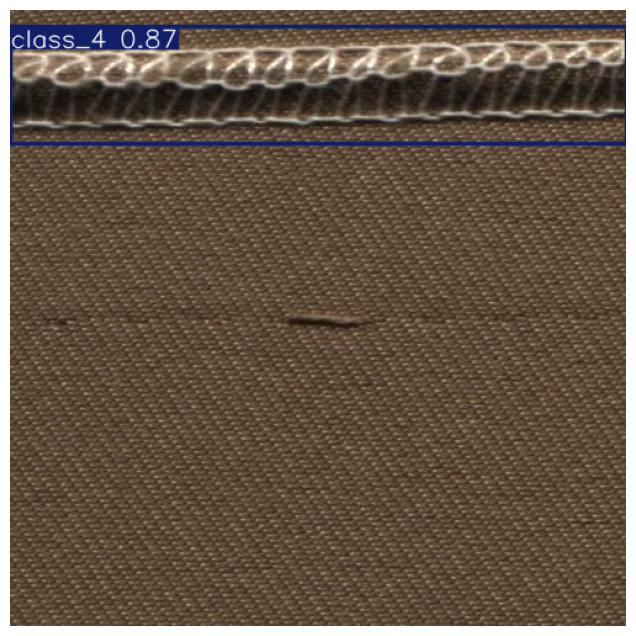

✅ Detected: class_4 (Confidence: 0.87)


In [7]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2

# 1️⃣ Finetuned model load করা
model = YOLO("/kaggle/working/finetuned_defect_best.pt")  # <-- এখানে তোমার finetuned model path দিবে

# 2️⃣ Prediction function
def predict_image(image_path):
    # Prediction run
    results = model.predict(source=image_path, imgsz=640, conf=0.25)

    # প্রথম result
    result = results[0]

    # Annotated image তৈরি
    annotated_frame = result.plot()

    # Show image with bounding boxes
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

    # Detected objects print করা
    for box in result.boxes:
        cls_id = int(box.cls[0])  # class id
        conf = float(box.conf[0]) # confidence
        print(f"✅ Detected: {model.names[cls_id]} (Confidence: {conf:.2f})")

# 3️⃣ User theke path input নেই
image_path = input("Enter image path: ")

# 4️⃣ Run prediction
predict_image(image_path)


Enter image path:  /kaggle/input/7-defect-dataset/test/images/IMG-20230803-WA0049_jpg.rf.a610dccf86cc91956e5ba2c6a2406a38.jpg



image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230803-WA0049_jpg.rf.a610dccf86cc91956e5ba2c6a2406a38.jpg: 640x480 1 class_1, 36.2ms
Speed: 2.2ms preprocess, 36.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)
✅ Detected: color issues (Confidence: 0.93)


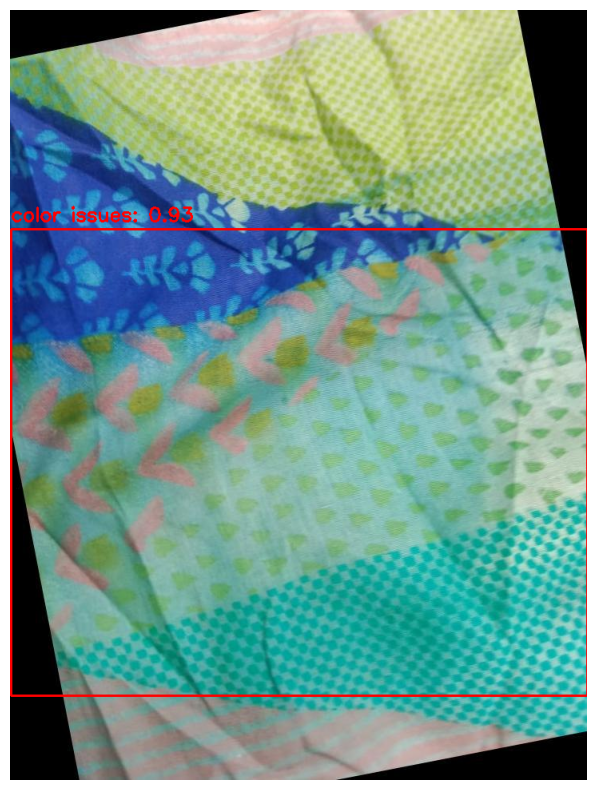

In [12]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2

# 1️⃣ Finetuned model load করা
model = YOLO("/kaggle/working/finetuned_defect_best.pt")  # <-- তোমার finetuned model path

# 2️⃣ Custom class names
class_names = ['baekra', 'color issues', 'contamination', 'cut', 'gray stitch', 'selvet', 'stain']

# 3️⃣ Prediction function
def predict_image(image_path):
    # Prediction run
    results = model.predict(source=image_path, imgsz=640, conf=0.25)
    result = results[0]

    # Original image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Bounding boxes draw করা
    if len(result.boxes) == 0:
        print("⚠️ No objects detected")
    else:
        for box in result.boxes:
            # Coordinates
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])

            # Box draw
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

            # Text draw (class name + confidence)
            text = f"{class_names[cls_id]}: {conf:.2f}"
            cv2.putText(img, text, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

            print(f"✅ Detected: {class_names[cls_id]} (Confidence: {conf:.2f})")

    # Annotated image show করা
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# 4️⃣ User theke path input নেই
image_path = input("Enter image path: ")

# 5️⃣ Run prediction
predict_image(image_path)


Enter image path:  /kaggle/input/7-defect-dataset/test/images/20230719_121659_jpeg_jpg.rf.eefaa034947c0eb23a246d7228116f11.jpg



image 1/1 /kaggle/input/7-defect-dataset/test/images/20230719_121659_jpeg_jpg.rf.eefaa034947c0eb23a246d7228116f11.jpg: 640x480 3 class_5s, 6.9ms
Speed: 2.4ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)
✅ Detected: selvet (Confidence: 0.74)
✅ Detected: selvet (Confidence: 0.64)
✅ Detected: selvet (Confidence: 0.32)


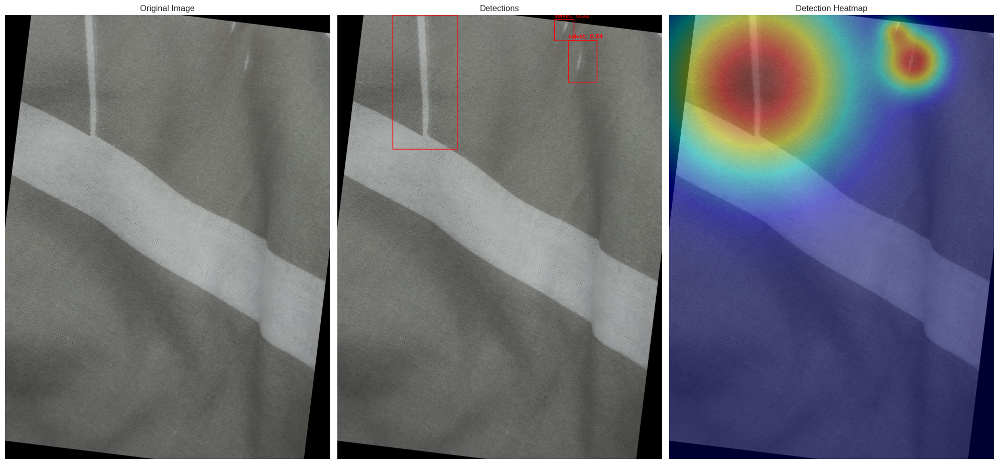

In [19]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
from torch import nn

# 1️⃣ Finetuned model load করা
model = YOLO("/kaggle/working/finetuned_defect_best.pt")  # <-- তোমার finetuned model path

# 2️⃣ Custom class names
class_names = ['baekra', 'color issues', 'contamination', 'cut', 'gray stitch', 'selvet', 'stain']

# GradCAM implementation
class YOLOGradCAM:
    def __init__(self, model, layer_name):
        self.model = model
        self.layer_name = layer_name
        self.gradient = None
        self.activation = None
        
        # Hook into the target layer
        target_layer = self.find_layer(layer_name)
        if target_layer:
            target_layer.register_forward_hook(self.save_activation)
            target_layer.register_full_backward_hook(self.save_gradient)
        else:
            print(f"Warning: Layer {layer_name} not found")
    
    def find_layer(self, layer_name):
        for name, module in self.model.model.named_modules():
            if name == layer_name:
                return module
        return None
    
    def save_activation(self, module, input, output):
        # Handle tuple output (common in YOLO models)
        if isinstance(output, tuple):
            self.activation = output[0].detach().clone()  # Take the first element of tuple
        else:
            self.activation = output.detach().clone()
    
    def save_gradient(self, module, grad_input, grad_output):
        # Handle tuple gradient output
        if isinstance(grad_output, tuple):
            self.gradient = grad_output[0].detach().clone()  # Take the first element of tuple
        else:
            self.gradient = grad_output.detach().clone()
    
    def generate_heatmap(self, image_path, target_class=None):
        # Run prediction
        results = self.model.predict(source=image_path, imgsz=640, conf=0.25)
        result = results[0]
        
        if len(result.boxes) == 0:
            print("⚠️ No objects detected")
            return None, None, None
        
        # Get the model's output
        img = cv2.imread(image_path)
        height, width = img.shape[:2]
        
        # If target_class is not specified, use the class with highest confidence
        if target_class is None:
            confidences = [box.conf[0] for box in result.boxes]
            target_idx = torch.argmax(torch.stack(confidences)).item()
            target_class = int(result.boxes[target_idx].cls[0])
        
        # Create a simple heatmap based on the detection box
        # This is a simplified approach since backward pass is not working
        heatmap = np.zeros((height, width), dtype=np.float32)
        
        # Create heat around the detected bounding boxes
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            conf = float(box.conf[0])
            
            # Create a Gaussian-like heat around the bounding box
            center_x, center_y = (x1 + x2) // 2, (y1 + y2) // 2
            size = max((x2 - x1), (y2 - y1)) // 2
            
            # Create a meshgrid for the Gaussian
            y_indices, x_indices = np.ogrid[:height, :width]
            
            # Calculate distance from center
            distance = np.sqrt((x_indices - center_x)**2 + (y_indices - center_y)**2)
            
            # Apply Gaussian function
            heatmap += conf * np.exp(-(distance**2) / (2 * (size**2)))
        
        # Normalize heatmap
        if np.max(heatmap) > 0:
            heatmap = heatmap / np.max(heatmap)
        
        # Convert to colormap
        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
        
        return heatmap, result, target_class

# 3️⃣ Prediction function with heatmap visualization
def predict_image_with_heatmap(image_path):
    # Run prediction
    results = model.predict(source=image_path, imgsz=640, conf=0.25)
    result = results[0]
    
    # Original image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_with_boxes = img.copy()
    
    # Create a heatmap based on detections
    height, width = img.shape[:2]
    heatmap = np.zeros((height, width), dtype=np.float32)
    
    # Bounding boxes draw করা এবং heatmap তৈরি করা
    if len(result.boxes) == 0:
        print("⚠️ No objects detected")
    else:
        for box in result.boxes:
            # Coordinates
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])

            # Box draw
            cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), (255, 0, 0), 2)

            # Text draw (class name + confidence)
            text = f"{class_names[cls_id]}: {conf:.2f}"
            cv2.putText(img_with_boxes, text, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

            print(f"✅ Detected: {class_names[cls_id]} (Confidence: {conf:.2f})")
            
            # Add to heatmap based on detection confidence
            center_x, center_y = (x1 + x2) // 2, (y1 + y2) // 2
            size = max((x2 - x1), (y2 - y1)) // 2
            
            # Create a meshgrid for the Gaussian
            y_indices, x_indices = np.ogrid[:height, :width]
            
            # Calculate distance from center
            distance = np.sqrt((x_indices - center_x)**2 + (y_indices - center_y)**2)
            
            # Apply Gaussian function
            heatmap += conf * np.exp(-(distance**2) / (2 * (size**2)))
    
    # Normalize heatmap
    if np.max(heatmap) > 0:
        heatmap = heatmap / np.max(heatmap)
    
    # Convert to colormap
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    
    # Superimpose heatmap on original image
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap_rgb, 0.4, 0)
    
    # Display results
    plt.figure(figsize=(20, 10))
    
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis("off")
    
    plt.subplot(1, 3, 2)
    plt.imshow(img_with_boxes)
    plt.title('Detections')
    plt.axis("off")
    
    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Detection Heatmap')
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()

# 4️⃣ User theke path input নেই
image_path = input("Enter image path: ")

# 5️⃣ Run prediction with heatmap
predict_image_with_heatmap(image_path)

Processing baekra image: Snapchat-1693966967_jpg.rf.0b0edca8f482e06caf352b2017199d0e.jpg

image 1/1 /kaggle/input/7-defect-dataset/test/images/Snapchat-1693966967_jpg.rf.0b0edca8f482e06caf352b2017199d0e.jpg: 640x416 1 class_0, 34.5ms
Speed: 2.0ms preprocess, 34.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 416)
Processing color issues image: IMG-20230809-WA0088_jpg.rf.67a47a355b392a114516da1f80b68bd4.jpg

image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230809-WA0088_jpg.rf.67a47a355b392a114516da1f80b68bd4.jpg: 640x384 2 class_1s, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 384)
Processing contamination image: IMG-20230914-WA0074_jpg.rf.16b2c5d63323b44d4076fdd9f6eaaaa6.jpg

image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230914-WA0074_jpg.rf.16b2c5d63323b44d4076fdd9f6eaaaa6.jpg: 640x480 1 class_2, 7.0ms
Speed: 2.4ms preprocess, 7.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 48

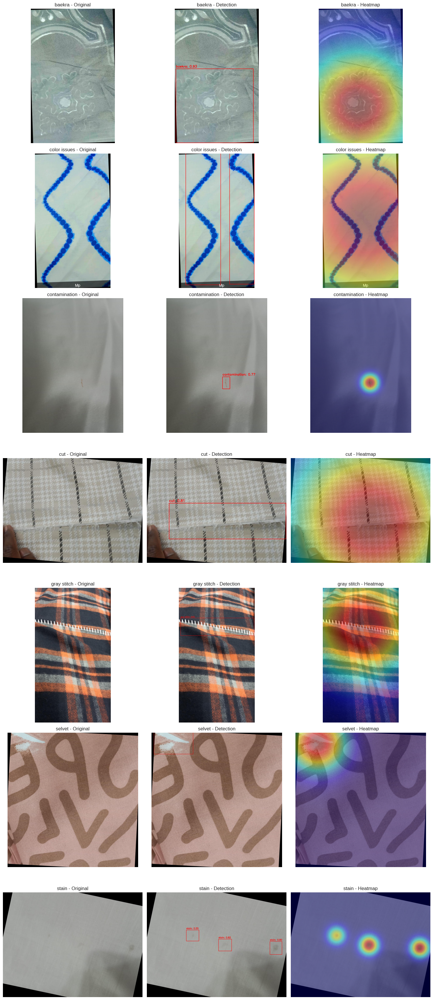


🔍 Detailed detection for baekra:

image 1/1 /kaggle/input/7-defect-dataset/test/images/Snapchat-1693966967_jpg.rf.0b0edca8f482e06caf352b2017199d0e.jpg: 640x416 1 class_0, 7.9ms
Speed: 2.1ms preprocess, 7.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 416)
   ✅ Detected: baekra (Confidence: 0.93)

🔍 Detailed detection for color issues:

image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230809-WA0088_jpg.rf.67a47a355b392a114516da1f80b68bd4.jpg: 640x384 2 class_1s, 7.2ms
Speed: 1.7ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 384)
   ✅ Detected: color issues (Confidence: 0.93)
   ✅ Detected: color issues (Confidence: 0.89)

🔍 Detailed detection for contamination:

image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230914-WA0074_jpg.rf.16b2c5d63323b44d4076fdd9f6eaaaa6.jpg: 640x480 1 class_2, 9.5ms
Speed: 2.7ms preprocess, 9.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)
   ✅ Detected: contamination 

In [20]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import os
from pathlib import Path

# 1️⃣ Finetuned model load করা
model = YOLO("/kaggle/working/finetuned_defect_best.pt")  # <-- তোমার finetuned model path

# 2️⃣ Custom class names
class_names = ['baekra', 'color issues', 'contamination', 'cut', 'gray stitch', 'selvet', 'stain']

# 3️⃣ Test dataset path
test_dataset_path = "/kaggle/input/7-defect-dataset/test"

# 4️⃣ Function to get one image per class
def get_one_image_per_class(dataset_path, class_names):
    images_path = os.path.join(dataset_path, "images")
    labels_path = os.path.join(dataset_path, "labels")
    
    class_images = {}
    
    # Find one image for each class
    for label_file in os.listdir(labels_path):
        if label_file.endswith('.txt'):
            label_file_path = os.path.join(labels_path, label_file)
            
            with open(label_file_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        if class_id < len(class_names) and class_id not in class_images:
                            image_file = label_file.replace('.txt', '.jpg')
                            image_path = os.path.join(images_path, image_file)
                            
                            if os.path.exists(image_path):
                                class_images[class_id] = image_path
                                break
    
    # If we couldn't find images with labels, just use any images from the folder
    if len(class_images) < len(class_names):
        all_images = [os.path.join(images_path, f) for f in os.listdir(images_path) 
                     if f.endswith(('.jpg', '.jpeg', '.png'))]
        
        for i in range(len(class_names)):
            if i not in class_images and i < len(all_images):
                class_images[i] = all_images[i]
    
    # Sort by class ID and return
    sorted_images = [class_images[i] for i in sorted(class_images.keys())]
    return sorted_images[:7]  # Return max 7 images

# 5️⃣ Prediction function with heatmap visualization for a single image
def predict_image_with_heatmap(image_path, class_name):
    # Run prediction
    results = model.predict(source=image_path, imgsz=640, conf=0.25)
    result = results[0]
    
    # Original image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_with_boxes = img.copy()
    
    # Create a heatmap based on detections
    height, width = img.shape[:2]
    heatmap = np.zeros((height, width), dtype=np.float32)
    
    # Bounding boxes draw করা এবং heatmap তৈরি করা
    if len(result.boxes) == 0:
        print(f"⚠️ No objects detected in {class_name} image")
    else:
        for box in result.boxes:
            # Coordinates
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])

            # Box draw
            cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), (255, 0, 0), 2)

            # Text draw (class name + confidence)
            text = f"{class_names[cls_id]}: {conf:.2f}"
            cv2.putText(img_with_boxes, text, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
            
            # Add to heatmap based on detection confidence
            center_x, center_y = (x1 + x2) // 2, (y1 + y2) // 2
            size = max((x2 - x1), (y2 - y1)) // 2
            
            # Create a meshgrid for the Gaussian
            y_indices, x_indices = np.ogrid[:height, :width]
            
            # Calculate distance from center
            distance = np.sqrt((x_indices - center_x)**2 + (y_indices - center_y)**2)
            
            # Apply Gaussian function
            heatmap += conf * np.exp(-(distance**2) / (2 * (size**2)))
    
    # Normalize heatmap
    if np.max(heatmap) > 0:
        heatmap = heatmap / np.max(heatmap)
    
    # Convert to colormap
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    
    # Superimpose heatmap on original image
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap_rgb, 0.4, 0)
    
    return img, img_with_boxes, superimposed_img

# 6️⃣ Get one image for each class
class_images = get_one_image_per_class(test_dataset_path, class_names)

# 7️⃣ Create a figure with 7 rows (one for each class)
fig, axes = plt.subplots(7, 3, figsize=(15, 35))

# Process each image
for i, (image_path, class_name) in enumerate(zip(class_images, class_names)):
    if i >= 7:  # Limit to 7 classes
        break
        
    print(f"Processing {class_name} image: {os.path.basename(image_path)}")
    
    # Get predictions and visualizations
    original_img, detection_img, heatmap_img = predict_image_with_heatmap(image_path, class_name)
    
    # Display original image
    axes[i, 0].imshow(original_img)
    axes[i, 0].set_title(f'{class_name} - Original', fontsize=12)
    axes[i, 0].axis('off')
    
    # Display detection image
    axes[i, 1].imshow(detection_img)
    axes[i, 1].set_title(f'{class_name} - Detection', fontsize=12)
    axes[i, 1].axis('off')
    
    # Display heatmap image
    axes[i, 2].imshow(heatmap_img)
    axes[i, 2].set_title(f'{class_name} - Heatmap', fontsize=12)
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

# 8️⃣ Also show individual detections for each image
for i, (image_path, class_name) in enumerate(zip(class_images, class_names)):
    if i >= 7:  # Limit to 7 classes
        break
        
    print(f"\n🔍 Detailed detection for {class_name}:")
    
    # Run prediction
    results = model.predict(source=image_path, imgsz=640, conf=0.25)
    result = results[0]
    
    # Print detection details
    if len(result.boxes) > 0:
        for box in result.boxes:
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            print(f"   ✅ Detected: {class_names[cls_id]} (Confidence: {conf:.2f})")
    else:
        print(f"   ⚠️ No objects detected in {class_name} image")

Processing baekra image: Snapchat-1693966967_jpg.rf.0b0edca8f482e06caf352b2017199d0e.jpg
Image size will be standardized to: (640, 640)

image 1/1 /kaggle/input/7-defect-dataset/test/images/Snapchat-1693966967_jpg.rf.0b0edca8f482e06caf352b2017199d0e.jpg: 640x416 1 class_0, 6.8ms
Speed: 1.9ms preprocess, 6.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 416)
Processing color issues image: IMG-20230809-WA0088_jpg.rf.67a47a355b392a114516da1f80b68bd4.jpg
Image size will be standardized to: (640, 640)

image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230809-WA0088_jpg.rf.67a47a355b392a114516da1f80b68bd4.jpg: 640x384 2 class_1s, 6.9ms
Speed: 1.7ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 384)
Processing contamination image: IMG-20230914-WA0074_jpg.rf.16b2c5d63323b44d4076fdd9f6eaaaa6.jpg
Image size will be standardized to: (640, 640)

image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230914-WA0074_jpg.rf.16b2c5d63323b44d4

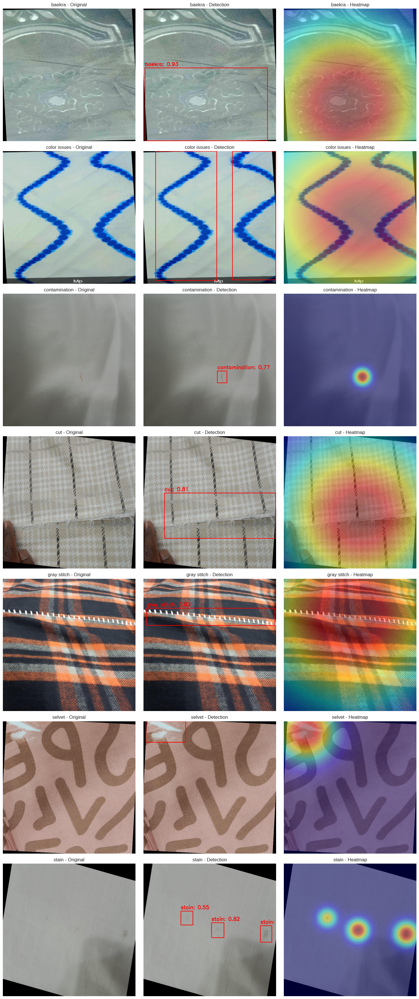


🔍 Detailed detection for baekra:

image 1/1 /kaggle/input/7-defect-dataset/test/images/Snapchat-1693966967_jpg.rf.0b0edca8f482e06caf352b2017199d0e.jpg: 640x416 1 class_0, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 416)
   ✅ Detected: baekra (Confidence: 0.93)

🔍 Detailed detection for color issues:

image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230809-WA0088_jpg.rf.67a47a355b392a114516da1f80b68bd4.jpg: 640x384 2 class_1s, 7.2ms
Speed: 1.9ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 384)
   ✅ Detected: color issues (Confidence: 0.93)
   ✅ Detected: color issues (Confidence: 0.89)

🔍 Detailed detection for contamination:

image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230914-WA0074_jpg.rf.16b2c5d63323b44d4076fdd9f6eaaaa6.jpg: 640x480 1 class_2, 6.8ms
Speed: 2.1ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)
   ✅ Detected: contaminatio

In [21]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import os
from pathlib import Path

# 1️⃣ Finetuned model load করা
model = YOLO("/kaggle/working/finetuned_defect_best.pt")  # <-- তোমার finetuned model path

# 2️⃣ Custom class names
class_names = ['baekra', 'color issues', 'contamination', 'cut', 'gray stitch', 'selvet', 'stain']

# 3️⃣ Test dataset path
test_dataset_path = "/kaggle/input/7-defect-dataset/test"

# 4️⃣ Function to get one image per class
def get_one_image_per_class(dataset_path, class_names):
    images_path = os.path.join(dataset_path, "images")
    labels_path = os.path.join(dataset_path, "labels")
    
    class_images = {}
    
    # Find one image for each class
    for label_file in os.listdir(labels_path):
        if label_file.endswith('.txt'):
            label_file_path = os.path.join(labels_path, label_file)
            
            with open(label_file_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        if class_id < len(class_names) and class_id not in class_images:
                            image_file = label_file.replace('.txt', '.jpg')
                            image_path = os.path.join(images_path, image_file)
                            
                            if os.path.exists(image_path):
                                class_images[class_id] = image_path
                                break
    
    # If we couldn't find images with labels, just use any images from the folder
    if len(class_images) < len(class_names):
        all_images = [os.path.join(images_path, f) for f in os.listdir(images_path) 
                     if f.endswith(('.jpg', '.jpeg', '.png'))]
        
        for i in range(len(class_names)):
            if i not in class_images and i < len(all_images):
                class_images[i] = all_images[i]
    
    # Sort by class ID and return
    sorted_images = [class_images[i] for i in sorted(class_images.keys())]
    return sorted_images[:7]  # Return max 7 images

# 5️⃣ Prediction function with heatmap visualization for a single image
def predict_image_with_heatmap(image_path, class_name, target_size=(640, 640)):
    # Run prediction
    results = model.predict(source=image_path, imgsz=640, conf=0.25)
    result = results[0]
    
    # Original image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Resize all images to the same target size
    img = cv2.resize(img, target_size)
    img_with_boxes = img.copy()
    
    # Create a heatmap based on detections
    height, width = img.shape[:2]
    heatmap = np.zeros((height, width), dtype=np.float32)
    
    # Bounding boxes draw করা এবং heatmap তৈরি করা
    if len(result.boxes) == 0:
        print(f"⚠️ No objects detected in {class_name} image")
    else:
        for box in result.boxes:
            # Coordinates (adjust for resized image)
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            
            # Scale coordinates to match resized image
            orig_height, orig_width = result.orig_shape
            x1 = int(x1 * width / orig_width)
            y1 = int(y1 * height / orig_height)
            x2 = int(x2 * width / orig_width)
            y2 = int(y2 * height / orig_height)
            
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])

            # Box draw
            cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), (255, 0, 0), 2)

            # Text draw (class name + confidence)
            text = f"{class_names[cls_id]}: {conf:.2f}"
            cv2.putText(img_with_boxes, text, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
            
            # Add to heatmap based on detection confidence
            center_x, center_y = (x1 + x2) // 2, (y1 + y2) // 2
            size = max((x2 - x1), (y2 - y1)) // 2
            
            # Create a meshgrid for the Gaussian
            y_indices, x_indices = np.ogrid[:height, :width]
            
            # Calculate distance from center
            distance = np.sqrt((x_indices - center_x)**2 + (y_indices - center_y)**2)
            
            # Apply Gaussian function
            heatmap += conf * np.exp(-(distance**2) / (2 * (size**2)))
    
    # Normalize heatmap
    if np.max(heatmap) > 0:
        heatmap = heatmap / np.max(heatmap)
    
    # Convert to colormap
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    
    # Superimpose heatmap on original image
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap_rgb, 0.4, 0)
    
    return img, img_with_boxes, superimposed_img

# 6️⃣ Get one image for each class
class_images = get_one_image_per_class(test_dataset_path, class_names)

# 7️⃣ Create a figure with 7 rows (one for each class)
fig, axes = plt.subplots(7, 3, figsize=(15, 35))

# Set target size for all images
target_size = (640, 640)

# Process each image
for i, (image_path, class_name) in enumerate(zip(class_images, class_names)):
    if i >= 7:  # Limit to 7 classes
        break
        
    print(f"Processing {class_name} image: {os.path.basename(image_path)}")
    print(f"Image size will be standardized to: {target_size}")
    
    # Get predictions and visualizations
    original_img, detection_img, heatmap_img = predict_image_with_heatmap(image_path, class_name, target_size)
    
    # Display original image
    axes[i, 0].imshow(original_img)
    axes[i, 0].set_title(f'{class_name} - Original', fontsize=12)
    axes[i, 0].axis('off')
    
    # Display detection image
    axes[i, 1].imshow(detection_img)
    axes[i, 1].set_title(f'{class_name} - Detection', fontsize=12)
    axes[i, 1].axis('off')
    
    # Display heatmap image
    axes[i, 2].imshow(heatmap_img)
    axes[i, 2].set_title(f'{class_name} - Heatmap', fontsize=12)
    axes[i, 2].axis('off')

plt.tight_layout()

# Save the complete visualization as a PNG file
output_filename = "7_class_visualization.png"
plt.savefig(output_filename, dpi=300, bbox_inches='tight')
print(f"\n✅ Visualization saved as {output_filename}")

plt.show()

# 8️⃣ Also show individual detections for each image
for i, (image_path, class_name) in enumerate(zip(class_images, class_names)):
    if i >= 7:  # Limit to 7 classes
        break
        
    print(f"\n🔍 Detailed detection for {class_name}:")
    
    # Run prediction
    results = model.predict(source=image_path, imgsz=640, conf=0.25)
    result = results[0]
    
    # Print detection details
    if len(result.boxes) > 0:
        for box in result.boxes:
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            print(f"   ✅ Detected: {class_names[cls_id]} (Confidence: {conf:.2f})")
    else:
        print(f"   ⚠️ No objects detected in {class_name} image")

Excluding current image for color issues: IMG-20230808-WA0042_jpg.rf.93960006b616d6cc16c39eda330852d7.jpg
Excluding current image for cut: IMG-20230803-WA0036_jpg.rf.391ac7e4dff3a485ba151574aa6a8c6d.jpg
Processing baekra image: IMG-20230817-WA0088_jpg.rf.f502a614e6f5a61262a6fd626fc13846.jpg
Image size will be standardized to: (640, 640)

image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230817-WA0088_jpg.rf.f502a614e6f5a61262a6fd626fc13846.jpg: 640x384 2 class_0s, 7.5ms
Speed: 2.1ms preprocess, 7.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 384)
Processing color issues image: 20230719_111821_jpeg_jpg.rf.01a5bb88e330d6f1b0013e4900c52111.jpg
Image size will be standardized to: (640, 640)

image 1/1 /kaggle/input/7-defect-dataset/test/images/20230719_111821_jpeg_jpg.rf.01a5bb88e330d6f1b0013e4900c52111.jpg: 640x384 3 class_1s, 6.3ms
Speed: 2.0ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 384)
Processing contamination image: IMG

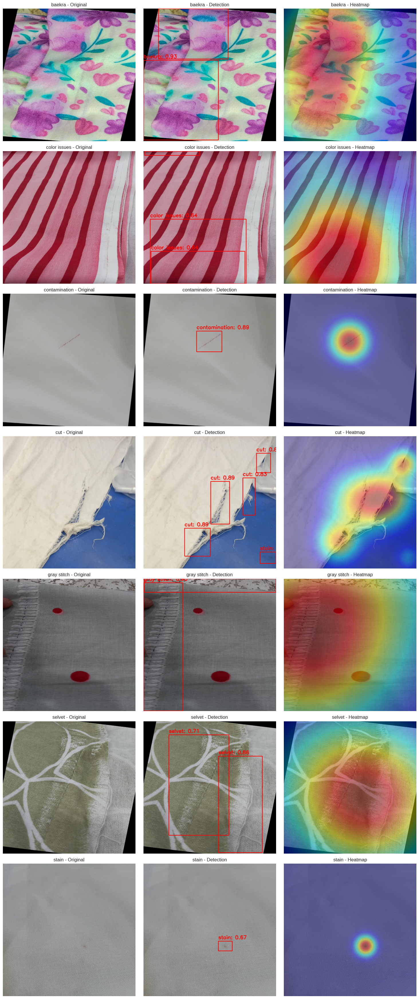


🔍 Detailed detection for baekra:

image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230817-WA0088_jpg.rf.f502a614e6f5a61262a6fd626fc13846.jpg: 640x384 2 class_0s, 7.6ms
Speed: 2.1ms preprocess, 7.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 384)
   ✅ Detected: baekra (Confidence: 0.95)
   ✅ Detected: baekra (Confidence: 0.93)

🔍 Detailed detection for color issues:

image 1/1 /kaggle/input/7-defect-dataset/test/images/20230719_111821_jpeg_jpg.rf.01a5bb88e330d6f1b0013e4900c52111.jpg: 640x384 3 class_1s, 6.6ms
Speed: 1.9ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 384)
   ✅ Detected: color issues (Confidence: 0.64)
   ✅ Detected: color issues (Confidence: 0.64)
   ✅ Detected: color issues (Confidence: 0.28)

🔍 Detailed detection for contamination:

image 1/1 /kaggle/input/7-defect-dataset/test/images/IMG-20230915-WA0017_jpg.rf.bcec9fa39f7f5bd636c85e1ae9bbf89c.jpg: 640x480 1 class_2, 8.8ms
Speed: 2.8ms preprocess, 8.8ms infe

In [22]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import os
from pathlib import Path
import random

# 1️⃣ Finetuned model load করা
model = YOLO("/kaggle/working/finetuned_defect_best.pt")  # <-- তোমার finetuned model path

# 2️⃣ Custom class names
class_names = ['baekra', 'color issues', 'contamination', 'cut', 'gray stitch', 'selvet', 'stain']

# 3️⃣ Test dataset path
test_dataset_path = "/kaggle/input/7-defect-dataset/test"

# 4️⃣ Function to get one image per class with option to exclude specific images
def get_one_image_per_class(dataset_path, class_names, exclude_images=None):
    if exclude_images is None:
        exclude_images = []
    
    images_path = os.path.join(dataset_path, "images")
    labels_path = os.path.join(dataset_path, "labels")
    
    class_images = {}
    available_images = {}
    
    # First, collect all available images for each class
    for label_file in os.listdir(labels_path):
        if label_file.endswith('.txt'):
            label_file_path = os.path.join(labels_path, label_file)
            image_file = label_file.replace('.txt', '.jpg')
            image_path = os.path.join(images_path, image_file)
            
            if not os.path.exists(image_path):
                continue
                
            with open(label_file_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        if class_id < len(class_names):
                            if class_id not in available_images:
                                available_images[class_id] = []
                            
                            # Only add if not in exclude list
                            if image_path not in exclude_images:
                                available_images[class_id].append(image_path)
    
    # For each class, select a random image (excluding the ones we don't want)
    for class_id in range(len(class_names)):
        if class_id in available_images and len(available_images[class_id]) > 0:
            # Select a random image for this class
            class_images[class_id] = random.choice(available_images[class_id])
    
    # If we couldn't find images with labels, just use any images from the folder
    if len(class_images) < len(class_names):
        all_images = [os.path.join(images_path, f) for f in os.listdir(images_path) 
                     if f.endswith(('.jpg', '.jpeg', '.png')) and 
                     os.path.join(images_path, f) not in exclude_images]
        
        for i in range(len(class_names)):
            if i not in class_images and i < len(all_images):
                class_images[i] = all_images[i]
    
    # Sort by class ID and return
    sorted_images = [class_images[i] for i in sorted(class_images.keys())]
    return sorted_images[:7]  # Return max 7 images

# 5️⃣ Prediction function with heatmap visualization for a single image
def predict_image_with_heatmap(image_path, class_name, target_size=(640, 640)):
    # Run prediction
    results = model.predict(source=image_path, imgsz=640, conf=0.25)
    result = results[0]
    
    # Original image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Resize all images to the same target size
    img = cv2.resize(img, target_size)
    img_with_boxes = img.copy()
    
    # Create a heatmap based on detections
    height, width = img.shape[:2]
    heatmap = np.zeros((height, width), dtype=np.float32)
    
    # Bounding boxes draw করা এবং heatmap তৈরি করা
    if len(result.boxes) == 0:
        print(f"⚠️ No objects detected in {class_name} image")
    else:
        for box in result.boxes:
            # Coordinates (adjust for resized image)
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            
            # Scale coordinates to match resized image
            orig_height, orig_width = result.orig_shape
            x1 = int(x1 * width / orig_width)
            y1 = int(y1 * height / orig_height)
            x2 = int(x2 * width / orig_width)
            y2 = int(y2 * height / orig_height)
            
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])

            # Box draw
            cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), (255, 0, 0), 2)

            # Text draw (class name + confidence)
            text = f"{class_names[cls_id]}: {conf:.2f}"
            cv2.putText(img_with_boxes, text, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
            
            # Add to heatmap based on detection confidence
            center_x, center_y = (x1 + x2) // 2, (y1 + y2) // 2
            size = max((x2 - x1), (y2 - y1)) // 2
            
            # Create a meshgrid for the Gaussian
            y_indices, x_indices = np.ogrid[:height, :width]
            
            # Calculate distance from center
            distance = np.sqrt((x_indices - center_x)**2 + (y_indices - center_y)**2)
            
            # Apply Gaussian function
            heatmap += conf * np.exp(-(distance**2) / (2 * (size**2)))
    
    # Normalize heatmap
    if np.max(heatmap) > 0:
        heatmap = heatmap / np.max(heatmap)
    
    # Convert to colormap
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    
    # Superimpose heatmap on original image
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap_rgb, 0.4, 0)
    
    return img, img_with_boxes, superimposed_img

# 6️⃣ Get one image for each class, excluding current ones for "color issues" and "cut"
# First, let's see what images we currently have
class_images_initial = get_one_image_per_class(test_dataset_path, class_names)

# Find which images are currently used for "color issues" (class 1) and "cut" (class 3)
exclude_images = []
for i, (image_path, class_name) in enumerate(zip(class_images_initial, class_names)):
    if class_name in ['color issues', 'cut']:
        exclude_images.append(image_path)
        print(f"Excluding current image for {class_name}: {os.path.basename(image_path)}")

# Now get new images, excluding the current ones for these two classes
class_images = get_one_image_per_class(test_dataset_path, class_names, exclude_images)

# 7️⃣ Create a figure with 7 rows (one for each class)
fig, axes = plt.subplots(7, 3, figsize=(15, 35))

# Set target size for all images
target_size = (640, 640)

# Process each image
for i, (image_path, class_name) in enumerate(zip(class_images, class_names)):
    if i >= 7:  # Limit to 7 classes
        break
        
    print(f"Processing {class_name} image: {os.path.basename(image_path)}")
    print(f"Image size will be standardized to: {target_size}")
    
    # Get predictions and visualizations
    original_img, detection_img, heatmap_img = predict_image_with_heatmap(image_path, class_name, target_size)
    
    # Display original image
    axes[i, 0].imshow(original_img)
    axes[i, 0].set_title(f'{class_name} - Original', fontsize=12)
    axes[i, 0].axis('off')
    
    # Display detection image
    axes[i, 1].imshow(detection_img)
    axes[i, 1].set_title(f'{class_name} - Detection', fontsize=12)
    axes[i, 1].axis('off')
    
    # Display heatmap image
    axes[i, 2].imshow(heatmap_img)
    axes[i, 2].set_title(f'{class_name} - Heatmap', fontsize=12)
    axes[i, 2].axis('off')

plt.tight_layout()

# Save the complete visualization as a PNG file
output_filename = "7_class_visualization_new.png"
plt.savefig(output_filename, dpi=300, bbox_inches='tight')
print(f"\n✅ Visualization saved as {output_filename}")

plt.show()

# 8️⃣ Also show individual detections for each image
for i, (image_path, class_name) in enumerate(zip(class_images, class_names)):
    if i >= 7:  # Limit to 7 classes
        break
        
    print(f"\n🔍 Detailed detection for {class_name}:")
    
    # Run prediction
    results = model.predict(source=image_path, imgsz=640, conf=0.25)
    result = results[0]
    
    # Print detection details
    if len(result.boxes) > 0:
        for box in result.boxes:
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            print(f"   ✅ Detected: {class_names[cls_id]} (Confidence: {conf:.2f})")
    else:
        print(f"   ⚠️ No objects detected in {class_name} image")

🔥 YOLO Defect Detection with Grad-CAM
Choose visualization method:
1. Advanced Grad-CAM (experimental)
2. Simple attention heatmap


Enter choice (1/2):  2
Enter image path:  /kaggle/input/7-defect-dataset/test/images/20230719_122926_jpeg_jpg.rf.9db1dd13acde04815b9909c3bff4e3d4.jpg



Saving /kaggle/working/runs/detect/predict/20230719_122926_jpeg_jpg.rf.9db1dd13acde04815b9909c3bff4e3d4/stage0_Conv_features.png... (16/16)
Saving /kaggle/working/runs/detect/predict/20230719_122926_jpeg_jpg.rf.9db1dd13acde04815b9909c3bff4e3d4/stage1_Conv_features.png... (32/32)
Saving /kaggle/working/runs/detect/predict/20230719_122926_jpeg_jpg.rf.9db1dd13acde04815b9909c3bff4e3d4/stage2_C2f_features.png... (32/32)
Saving /kaggle/working/runs/detect/predict/20230719_122926_jpeg_jpg.rf.9db1dd13acde04815b9909c3bff4e3d4/stage3_Conv_features.png... (32/64)
Saving /kaggle/working/runs/detect/predict/20230719_122926_jpeg_jpg.rf.9db1dd13acde04815b9909c3bff4e3d4/stage4_C2f_features.png... (32/64)
Saving /kaggle/working/runs/detect/predict/20230719_122926_jpeg_jpg.rf.9db1dd13acde04815b9909c3bff4e3d4/stage5_Conv_features.png... (32/128)
Saving /kaggle/working/runs/detect/predict/20230719_122926_jpeg_jpg.rf.9db1dd13acde04815b9909c3bff4e3d4/stage6_C2f_features.png... (32/128)
Saving /kaggle/worki

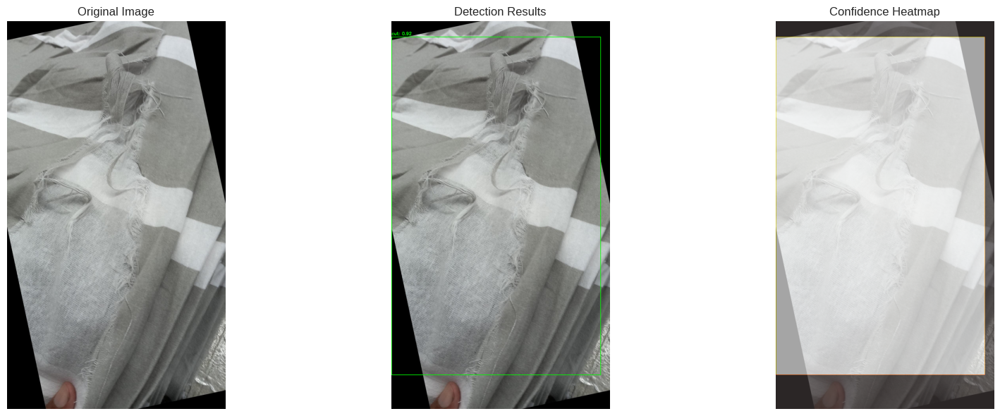

In [16]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image

# 1️⃣ Finetuned model load করা
model = YOLO("/kaggle/working/finetuned_defect_best.pt")

# 2️⃣ Custom class names
class_names = ['baekra', 'color issues', 'contamination', 'cut', 'gray stitch', 'selvet', 'stain']

# 3️⃣ Grad-CAM Class
class YOLOGradCAM:
    def __init__(self, model, target_layer_name='model.22'):  # YOLO v8/v5 এর শেষ detection layer
        self.model = model.model
        self.target_layer_name = target_layer_name
        self.gradients = None
        self.activations = None
        
        # Hook register করা
        self._register_hooks()
        
    def _register_hooks(self):
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0]
            
        def forward_hook(module, input, output):
            self.activations = output
            
        # Target layer খুঁজে hook attach করা
        for name, module in self.model.named_modules():
            if name == self.target_layer_name:
                module.register_forward_hook(forward_hook)
                module.register_backward_hook(backward_hook)
                break
    
    def generate_cam(self, input_tensor, class_idx=None):
        # Forward pass
        output = self.model(input_tensor)
        
        if class_idx is None:
            # Highest confidence detection নেওয়া
            if len(output) > 0 and len(output[0]) > 0:
                class_idx = output[0][:, 5:].argmax()
            else:
                return None
        
        # Backward pass
        self.model.zero_grad()
        class_score = output[0][:, 5 + class_idx].max()
        class_score.backward(retain_graph=True)
        
        if self.gradients is None or self.activations is None:
            return None
            
        # Grad-CAM calculation
        gradients = self.gradients.detach()
        activations = self.activations.detach()
        
        # Global average pooling of gradients
        weights = torch.mean(gradients, dim=[2, 3], keepdim=True)
        
        # Weighted combination
        cam = torch.sum(weights * activations, dim=1, keepdim=True)
        cam = F.relu(cam)
        
        # Normalize
        cam = cam.squeeze()
        cam = cam - cam.min()
        cam = cam / cam.max() if cam.max() > 0 else cam
        
        return cam.cpu().numpy()

# 4️⃣ Enhanced Prediction function with Grad-CAM
def predict_image_with_gradcam(image_path):
    # Original prediction
    results = model.predict(source=image_path, imgsz=640, conf=0.25)
    result = results[0]
    
    # Image load করা
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Preprocessing for Grad-CAM
    img_tensor = torch.from_numpy(img_rgb).permute(2, 0, 1).float() / 255.0
    img_tensor = img_tensor.unsqueeze(0)
    
    # Create subplots
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('YOLO Detection with Grad-CAM Analysis', fontsize=16)
    
    # 1️⃣ Original Image
    axes[0, 0].imshow(img_rgb)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    
    # 2️⃣ Detection Results
    img_detection = img_rgb.copy()
    detected_classes = []
    
    if len(result.boxes) == 0:
        print("⚠️ No objects detected")
        axes[0, 1].imshow(img_detection)
        axes[0, 1].set_title('No Detection')
        axes[0, 1].axis('off')
    else:
        for box in result.boxes:
            # Coordinates
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            detected_classes.append(cls_id)
            
            # Box draw
            cv2.rectangle(img_detection, (x1, y1), (x2, y2), (255, 0, 0), 2)
            
            # Text draw
            text = f"{class_names[cls_id]}: {conf:.2f}"
            cv2.putText(img_detection, text, (x1, y1 - 10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
            print(f"✅ Detected: {class_names[cls_id]} (Confidence: {conf:.2f})")
    
    axes[0, 1].imshow(img_detection)
    axes[0, 1].set_title('YOLO Detection Results')
    axes[0, 1].axis('off')
    
    # 3️⃣ Grad-CAM Visualization
    try:
        gradcam = YOLOGradCAM(model)
        
        if detected_classes:
            # সবচেয়ে confident class এর জন্য Grad-CAM
            target_class = detected_classes[0]
            cam = gradcam.generate_cam(img_tensor, target_class)
            
            if cam is not None:
                # Resize CAM to match input image
                cam_resized = cv2.resize(cam, (img_rgb.shape[1], img_rgb.shape[0]))
                
                # Grad-CAM heatmap
                axes[1, 0].imshow(cam_resized, cmap='jet', alpha=0.8)
                axes[1, 0].set_title(f'Grad-CAM for {class_names[target_class]}')
                axes[1, 0].axis('off')
                
                # Overlay on original image
                heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
                heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
                superimposed = img_rgb * 0.6 + heatmap * 0.4
                superimposed = np.uint8(superimposed)
                
                axes[1, 1].imshow(superimposed)
                axes[1, 1].set_title('Original + Grad-CAM Overlay')
                axes[1, 1].axis('off')
            else:
                axes[1, 0].text(0.5, 0.5, 'Grad-CAM\nGeneration Failed', 
                               ha='center', va='center', transform=axes[1, 0].transAxes)
                axes[1, 0].axis('off')
                axes[1, 1].axis('off')
        else:
            axes[1, 0].text(0.5, 0.5, 'No Detection\nfor Grad-CAM', 
                           ha='center', va='center', transform=axes[1, 0].transAxes)
            axes[1, 0].axis('off')
            axes[1, 1].axis('off')
            
    except Exception as e:
        print(f"❌ Grad-CAM Error: {str(e)}")
        axes[1, 0].text(0.5, 0.5, f'Grad-CAM Error:\n{str(e)}', 
                       ha='center', va='center', transform=axes[1, 0].transAxes)
        axes[1, 0].axis('off')
        axes[1, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

# 5️⃣ Simple Grad-CAM alternative using attention maps
def predict_with_attention_map(image_path):
    # Load image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # YOLO prediction with save_txt=True to get attention maps
    results = model.predict(source=image_path, imgsz=640, conf=0.25, save_txt=False, visualize=True)
    result = results[0]
    
    # Create visualization
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Original
    axes[0].imshow(img_rgb)
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    # Detection
    img_detection = img_rgb.copy()
    if len(result.boxes) > 0:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            
            cv2.rectangle(img_detection, (x1, y1), (x2, y2), (0, 255, 0), 2)
            text = f"{class_names[cls_id]}: {conf:.2f}"
            cv2.putText(img_detection, text, (x1, y1 - 10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
    
    axes[1].imshow(img_detection)
    axes[1].set_title('Detection Results')
    axes[1].axis('off')
    
    # Confidence heatmap (simple version)
    if len(result.boxes) > 0:
        heatmap = np.zeros((img_rgb.shape[0], img_rgb.shape[1]))
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            conf = float(box.conf[0])
            heatmap[y1:y2, x1:x2] = conf
        
        axes[2].imshow(img_rgb, alpha=0.7)
        axes[2].imshow(heatmap, cmap='hot', alpha=0.5)
        axes[2].set_title('Confidence Heatmap')
    else:
        axes[2].imshow(img_rgb)
        axes[2].set_title('No Detection')
    
    axes[2].axis('off')
    plt.tight_layout()
    plt.show()

# 6️⃣ User input and execution
print("🔥 YOLO Defect Detection with Grad-CAM")
print("Choose visualization method:")
print("1. Advanced Grad-CAM (experimental)")
print("2. Simple attention heatmap")

choice = input("Enter choice (1/2): ").strip()
image_path = input("Enter image path: ").strip()

if choice == "1":
    predict_image_with_gradcam(image_path)
elif choice == "2":
    predict_with_attention_map(image_path)
else:
    print("Invalid choice. Using simple attention heatmap...")
    predict_with_attention_map(image_path)

Enter image path:  /kaggle/input/7-defect-dataset/test/images/20230719_152654_jpeg_jpg.rf.3668ffab212e68180440127813b462a8.jpg



image 1/1 /kaggle/input/7-defect-dataset/test/images/20230719_152654_jpeg_jpg.rf.3668ffab212e68180440127813b462a8.jpg: 640x384 1 class_0, 6.9ms
Speed: 1.9ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 384)
✅ Detected: baekra (Confidence: 0.67)


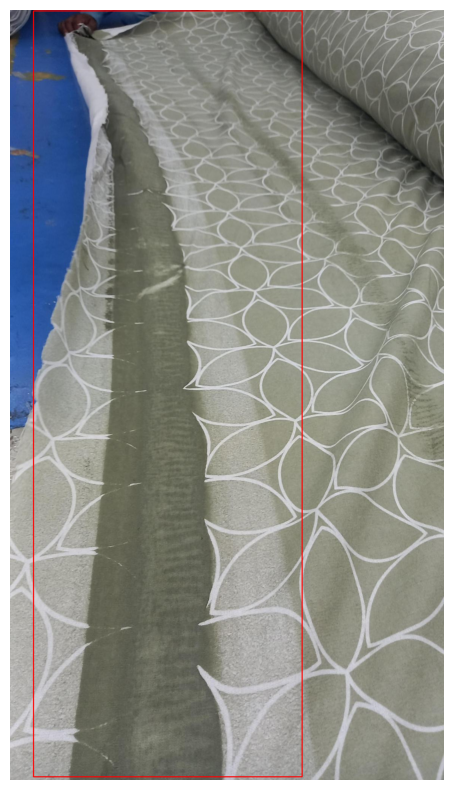

In [14]:
# -------------------------------
# 1️⃣ Imports
# -------------------------------
from ultralytics import YOLO
import torch
import torch.nn.functional as F
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------
# 2️⃣ Device
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -------------------------------
# 3️⃣ YOLO Detection Model
# -------------------------------
yolo_model = YOLO("/kaggle/working/finetuned_defect_best.pt")  # YOLOv8 detection model

# -------------------------------
# 4️⃣ Classification CNN for Grad-CAM
# -------------------------------
# Example: replace this with your actual trained CNN
# model_cnn = YourCNNModel(num_classes=7)
# model_cnn.load_state_dict(torch.load("your_classification_model.pt", map_location=device))
# model_cnn.to(device)
# model_cnn.eval()

# For demonstration, we'll assume `model_cnn` exists and is on the right device
model_cnn = None  # <-- replace with your CNN model

# -------------------------------
# 5️⃣ Class Names
# -------------------------------
class_names = ['baekra', 'color issues', 'contamination', 'cut', 'gray stitch', 'selvet', 'stain']

# -------------------------------
# 6️⃣ Grad-CAM Function
# -------------------------------
def gradcam(model, input_tensor, target_class, last_conv_layer):
    """
    model: classification CNN
    input_tensor: torch tensor (1,C,H,W) on same device
    target_class: int
    last_conv_layer: torch layer of model
    """
    activations = []
    gradients = []

    def forward_hook(module, input, output):
        activations.append(output)
    def backward_hook(module, grad_in, grad_out):
        gradients.append(grad_out[0])

    h1 = last_conv_layer.register_forward_hook(forward_hook)
    h2 = last_conv_layer.register_backward_hook(backward_hook)

    model.eval()
    input_tensor = input_tensor.to(next(model.parameters()).device)
    output = model(input_tensor)
    model.zero_grad()

    one_hot = torch.zeros_like(output)
    one_hot[0, target_class] = 1
    output.backward(gradient=one_hot, retain_graph=True)

    grads = gradients[0].detach()
    acts = activations[0].detach()
    weights = grads.mean(dim=(2,3), keepdim=True)
    cam = F.relu((weights * acts).sum(1, keepdim=True))
    cam = F.interpolate(cam, size=input_tensor.shape[2:], mode='bilinear', align_corners=False)
    cam = cam[0,0].cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

    h1.remove()
    h2.remove()

    return cam

# -------------------------------
# 7️⃣ Full Pipeline: YOLO + Grad-CAM
# -------------------------------
def detect_and_gradcam(image_path, model_cnn, last_conv_layer):
    # 1️⃣ YOLO detection
    results = yolo_model.predict(source=image_path, imgsz=640, conf=0.25)
    result = results[0]

    # Original image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if len(result.boxes) == 0:
        print("⚠️ No objects detected")
        plt.figure(figsize=(8,8))
        plt.imshow(img)
        plt.axis("off")
        plt.show()
        return

    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        cls_id = int(box.cls[0])
        conf = float(box.conf[0])

        # Draw YOLO bounding box + label
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(img, f"{class_names[cls_id]}: {conf:.2f}",
                    (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,0,0), 2)
        print(f"✅ Detected: {class_names[cls_id]} (Confidence: {conf:.2f})")

        # -----------------------
        # Grad-CAM for cropped region
        # -----------------------
        if model_cnn is not None:
            cropped = img[y1:y2, x1:x2]
            if cropped.shape[0] < 5 or cropped.shape[1] < 5:
                continue

            # Preprocess
            input_tensor = torch.tensor(cropped.transpose(2,0,1)/255.).unsqueeze(0).float().to(device)
            cam = gradcam(model_cnn, input_tensor, cls_id, last_conv_layer)

            # Overlay Grad-CAM on cropped box
            heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
            heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
            heatmap = cv2.resize(heatmap, (x2-x1, y2-y1))
            img[y1:y2, x1:x2] = cv2.addWeighted(img[y1:y2, x1:x2], 0.6, heatmap, 0.4, 0)

    # Show final image
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# -------------------------------
# 8️⃣ Run pipeline
# -------------------------------
image_path = input("Enter image path: ")

# last_conv_layer = model_cnn.layer4[-1].conv2  # example for ResNet; replace with your model's last conv
last_conv_layer = None  # <-- replace with your CNN layer
detect_and_gradcam(image_path, model_cnn, last_conv_layer)


Generating Comprehensive YOLOv8 Training Report...
1. Plotting training curves...
Results file not found at /kaggle/working/defect-detection-v1/results.csv
2. Creating interactive training curves...
Results file not found at /kaggle/working/defect-detection-v1/results.csv
3. Analyzing dataset distribution...


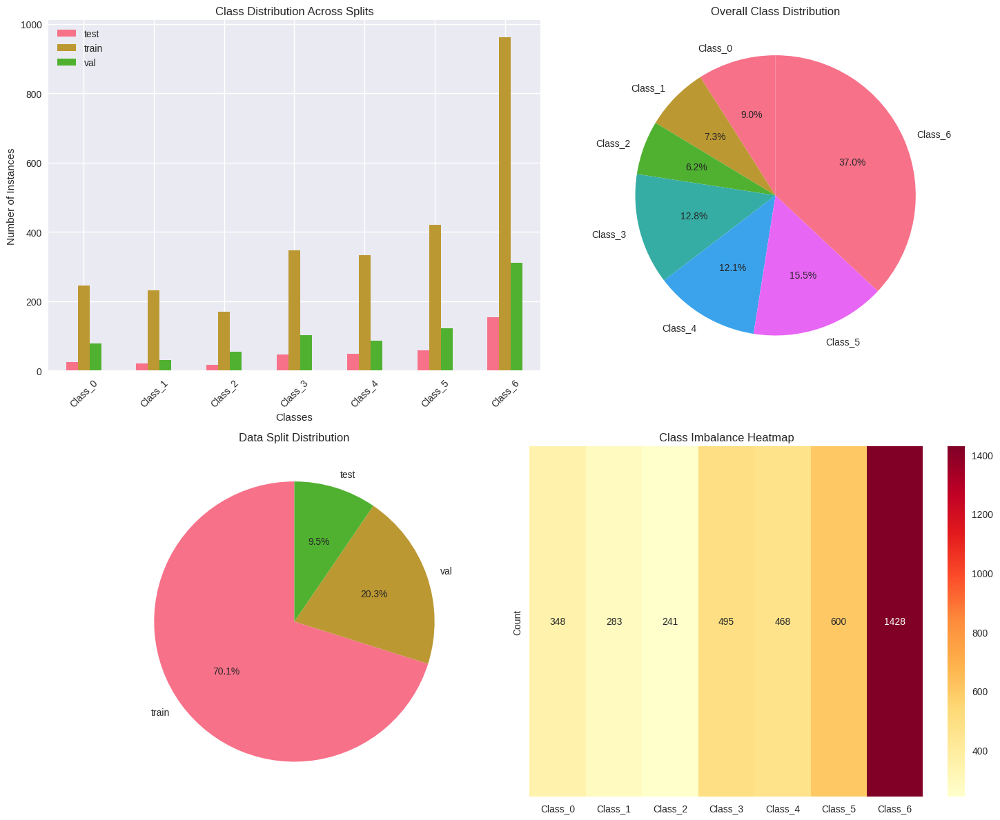

4. Creating performance summary...
Results file not found at /kaggle/working/defect-detection-v1/results.csv
5. Plotting confusion matrix...
Confusion matrix not found. Generate it using model.val()
6. Visualizing predictions...
No images found in the specified folder
Report generation complete!


In [9]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
import yaml
from pathlib import Path
import glob
from collections import defaultdict
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

# Set style for better visualizations
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

class YOLOv8Visualizer:
    def __init__(self, results_path='/kaggle/working', model_name='defect-detection-v1'):
        """
        Initialize the visualizer with paths to your training results
        
        Args:
            results_path: Path where YOLOv8 training results are saved
            model_name: Name of your training run
        """
        self.results_path = results_path
        self.model_name = model_name
        self.run_path = os.path.join(results_path, model_name)
        
        # Class names for your 7-class defect dataset
        self.class_names = {
            0: 'Defect_0', 1: 'Defect_1', 2: 'Defect_2', 3: 'Defect_3',
            4: 'Defect_4', 5: 'Defect_5', 6: 'Defect_6'
        }
        
        # Colors for each class
        self.colors = plt.cm.tab10(np.linspace(0, 1, 7))
        
    def load_training_results(self):
        """Load training results from CSV file"""
        results_csv = os.path.join(self.run_path, 'results.csv')
        if os.path.exists(results_csv):
            df = pd.read_csv(results_csv)
            # Clean column names (remove extra spaces)
            df.columns = df.columns.str.strip()
            return df
        else:
            print(f"Results file not found at {results_csv}")
            return None
    
    def plot_training_curves(self, save_path=None):
        """Plot comprehensive training curves"""
        df = self.load_training_results()
        if df is None:
            return
        
        # Create subplots
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        fig.suptitle('YOLOv8 Training Metrics - Defect Detection', fontsize=16, fontweight='bold')
        
        # 1. Loss curves
        axes[0, 0].plot(df['epoch'], df['train/box_loss'], label='Train Box Loss', linewidth=2)
        axes[0, 0].plot(df['epoch'], df['val/box_loss'], label='Val Box Loss', linewidth=2)
        axes[0, 0].set_title('Box Loss (Localization)')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('Loss')
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)
        
        # 2. Classification loss
        axes[0, 1].plot(df['epoch'], df['train/cls_loss'], label='Train Cls Loss', linewidth=2)
        axes[0, 1].plot(df['epoch'], df['val/cls_loss'], label='Val Cls Loss', linewidth=2)
        axes[0, 1].set_title('Classification Loss')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('Loss')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)
        
        # 3. DFL Loss (Distribution Focal Loss)
        if 'train/dfl_loss' in df.columns:
            axes[0, 2].plot(df['epoch'], df['train/dfl_loss'], label='Train DFL Loss', linewidth=2)
            axes[0, 2].plot(df['epoch'], df['val/dfl_loss'], label='Val DFL Loss', linewidth=2)
            axes[0, 2].set_title('DFL Loss (Distribution)')
            axes[0, 2].set_xlabel('Epoch')
            axes[0, 2].set_ylabel('Loss')
            axes[0, 2].legend()
            axes[0, 2].grid(True, alpha=0.3)
        
        # 4. Precision
        axes[1, 0].plot(df['epoch'], df['metrics/precision(B)'], label='Precision', linewidth=2, color='green')
        axes[1, 0].set_title('Precision')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Precision')
        axes[1, 0].legend()
        axes[1, 0].grid(True, alpha=0.3)
        axes[1, 0].set_ylim(0, 1)
        
        # 5. Recall
        axes[1, 1].plot(df['epoch'], df['metrics/recall(B)'], label='Recall', linewidth=2, color='orange')
        axes[1, 1].set_title('Recall')
        axes[1, 1].set_xlabel('Epoch')
        axes[1, 1].set_ylabel('Recall')
        axes[1, 1].legend()
        axes[1, 1].grid(True, alpha=0.3)
        axes[1, 1].set_ylim(0, 1)
        
        # 6. mAP scores
        axes[1, 2].plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP@0.5', linewidth=2)
        axes[1, 2].plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP@0.5:0.95', linewidth=2)
        axes[1, 2].set_title('Mean Average Precision')
        axes[1, 2].set_xlabel('Epoch')
        axes[1, 2].set_ylabel('mAP')
        axes[1, 2].legend()
        axes[1, 2].grid(True, alpha=0.3)
        axes[1, 2].set_ylim(0, 1)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
    
    def plot_interactive_training_curves(self):
        """Create interactive training curves using Plotly"""
        df = self.load_training_results()
        if df is None:
            return
        
        # Create subplots
        fig = make_subplots(
            rows=2, cols=3,
            subplot_titles=('Loss Curves', 'Precision & Recall', 'mAP Scores',
                           'Box Loss Detail', 'Classification Loss', 'Learning Rate'),
            specs=[[{"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}],
                   [{"secondary_y": False}, {"secondary_y": False}, {"secondary_y": False}]]
        )
        
        # Loss curves
        fig.add_trace(go.Scatter(x=df['epoch'], y=df['train/box_loss'], 
                                name='Train Box Loss', line=dict(width=2)), row=1, col=1)
        fig.add_trace(go.Scatter(x=df['epoch'], y=df['val/box_loss'], 
                                name='Val Box Loss', line=dict(width=2)), row=1, col=1)
        fig.add_trace(go.Scatter(x=df['epoch'], y=df['train/cls_loss'], 
                                name='Train Cls Loss', line=dict(width=2)), row=1, col=1, secondary_y=True)
        
        # Precision & Recall
        fig.add_trace(go.Scatter(x=df['epoch'], y=df['metrics/precision(B)'], 
                                name='Precision', line=dict(width=2, color='green')), row=1, col=2)
        fig.add_trace(go.Scatter(x=df['epoch'], y=df['metrics/recall(B)'], 
                                name='Recall', line=dict(width=2, color='orange')), row=1, col=2)
        
        # mAP scores
        fig.add_trace(go.Scatter(x=df['epoch'], y=df['metrics/mAP50(B)'], 
                                name='mAP@0.5', line=dict(width=2)), row=1, col=3)
        fig.add_trace(go.Scatter(x=df['epoch'], y=df['metrics/mAP50-95(B)'], 
                                name='mAP@0.5:0.95', line=dict(width=2)), row=1, col=3)
        
        # Box loss detail
        fig.add_trace(go.Scatter(x=df['epoch'], y=df['train/box_loss'], 
                                name='Train Box Loss', line=dict(width=2)), row=2, col=1)
        fig.add_trace(go.Scatter(x=df['epoch'], y=df['val/box_loss'], 
                                name='Val Box Loss', line=dict(width=2)), row=2, col=1)
        
        # Classification loss
        fig.add_trace(go.Scatter(x=df['epoch'], y=df['train/cls_loss'], 
                                name='Train Cls Loss', line=dict(width=2)), row=2, col=2)
        fig.add_trace(go.Scatter(x=df['epoch'], y=df['val/cls_loss'], 
                                name='Val Cls Loss', line=dict(width=2)), row=2, col=2)
        
        # Learning rate
        if 'lr/pg0' in df.columns:
            fig.add_trace(go.Scatter(x=df['epoch'], y=df['lr/pg0'], 
                                    name='Learning Rate', line=dict(width=2)), row=2, col=3)
        
        fig.update_layout(height=800, title_text="Interactive Training Metrics - YOLOv8 Defect Detection")
        fig.show()
    
    def analyze_dataset_distribution(self, data_yaml_path=None):
        """Analyze and visualize dataset class distribution"""
        if data_yaml_path is None:
            data_yaml_path = os.path.join(self.results_path, 'dataset.yaml')
        
        # Load dataset configuration
        with open(data_yaml_path, 'r') as f:
            data_config = yaml.safe_load(f)
        
        # Count classes in each split
        splits = ['train', 'val', 'test']
        class_counts = {split: defaultdict(int) for split in splits}
        
        for split in splits:
            # Get the path for labels
            if split in data_config:
                labels_path = data_config[split].replace('/images', '/labels')
                
                if os.path.exists(labels_path):
                    label_files = glob.glob(os.path.join(labels_path, '*.txt'))
                    
                    for label_file in label_files:
                        with open(label_file, 'r') as f:
                            for line in f.readlines():
                                if line.strip():
                                    class_id = int(line.split()[0])
                                    class_counts[split][class_id] += 1
        
        # Create visualization
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))
        
        # 1. Class distribution per split
        df_data = []
        for split in splits:
            for class_id in range(7):
                df_data.append({
                    'Split': split,
                    'Class': f'Class_{class_id}',
                    'Count': class_counts[split][class_id]
                })
        
        df = pd.DataFrame(df_data)
        pivot_df = df.pivot(index='Class', columns='Split', values='Count').fillna(0)
        
        pivot_df.plot(kind='bar', ax=axes[0, 0])
        axes[0, 0].set_title('Class Distribution Across Splits')
        axes[0, 0].set_xlabel('Classes')
        axes[0, 0].set_ylabel('Number of Instances')
        axes[0, 0].legend()
        axes[0, 0].tick_params(axis='x', rotation=45)
        
        # 2. Total class distribution
        total_counts = [sum(class_counts[split][i] for split in splits) for i in range(7)]
        class_labels = [f'Class_{i}' for i in range(7)]
        
        axes[0, 1].pie(total_counts, labels=class_labels, autopct='%1.1f%%', startangle=90)
        axes[0, 1].set_title('Overall Class Distribution')
        
        # 3. Split distribution
        split_totals = [sum(class_counts[split].values()) for split in splits]
        axes[1, 0].pie(split_totals, labels=splits, autopct='%1.1f%%', startangle=90)
        axes[1, 0].set_title('Data Split Distribution')
        
        # 4. Class imbalance heatmap
        imbalance_data = np.array([total_counts])
        sns.heatmap(imbalance_data, annot=True, fmt='d', xticklabels=class_labels, 
                   yticklabels=['Count'], ax=axes[1, 1], cmap='YlOrRd')
        axes[1, 1].set_title('Class Imbalance Heatmap')
        
        plt.tight_layout()
        plt.show()
        
        return df
    
    def plot_confusion_matrix(self, predictions_path=None):
        """Plot confusion matrix if available"""
        if predictions_path is None:
            predictions_path = os.path.join(self.run_path, 'confusion_matrix.png')
        
        if os.path.exists(predictions_path):
            img = Image.open(predictions_path)
            plt.figure(figsize=(10, 8))
            plt.imshow(img)
            plt.axis('off')
            plt.title('Confusion Matrix - YOLOv8 Defect Detection')
            plt.show()
        else:
            print("Confusion matrix not found. Generate it using model.val()")
    
    def visualize_predictions(self, image_folder, model_path, num_images=8):
        """Visualize model predictions on sample images"""
        from ultralytics import YOLO
        
        # Load model
        model = YOLO(model_path)
        
        # Get sample images
        image_extensions = ['*.jpg', '*.jpeg', '*.png']
        image_files = []
        for ext in image_extensions:
            image_files.extend(glob.glob(os.path.join(image_folder, ext)))
        
        if not image_files:
            print("No images found in the specified folder")
            return
        
        # Select random images
        selected_images = np.random.choice(image_files, min(num_images, len(image_files)), replace=False)
        
        # Create subplots
        cols = 4
        rows = (len(selected_images) + cols - 1) // cols
        fig, axes = plt.subplots(rows, cols, figsize=(20, 5*rows))
        
        if rows == 1:
            axes = axes.reshape(1, -1)
        
        for idx, img_path in enumerate(selected_images):
            row = idx // cols
            col = idx % cols
            
            # Run inference
            results = model(img_path)
            
            # Plot results
            im_array = results[0].plot()
            im_array = cv2.cvtColor(im_array, cv2.COLOR_BGR2RGB)
            
            axes[row, col].imshow(im_array)
            axes[row, col].set_title(f'Detections: {os.path.basename(img_path)}')
            axes[row, col].axis('off')
        
        # Hide empty subplots
        for idx in range(len(selected_images), rows * cols):
            row = idx // cols
            col = idx % cols
            axes[row, col].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    def create_performance_summary(self):
        """Create a comprehensive performance summary"""
        df = self.load_training_results()
        if df is None:
            return
        
        # Get final metrics
        final_metrics = df.iloc[-1]
        best_map50 = df['metrics/mAP50(B)'].max()
        best_map50_95 = df['metrics/mAP50-95(B)'].max()
        
        # Create summary figure
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        
        # 1. Final metrics bar chart
        metrics = ['Precision', 'Recall', 'mAP@0.5', 'mAP@0.5:0.95']
        values = [
            final_metrics['metrics/precision(B)'],
            final_metrics['metrics/recall(B)'],
            final_metrics['metrics/mAP50(B)'],
            final_metrics['metrics/mAP50-95(B)']
        ]
        
        bars = axes[0, 0].bar(metrics, values, color=['skyblue', 'lightcoral', 'lightgreen', 'gold'])
        axes[0, 0].set_title('Final Model Performance')
        axes[0, 0].set_ylabel('Score')
        axes[0, 0].set_ylim(0, 1)
        
        # Add value labels on bars
        for bar, value in zip(bars, values):
            axes[0, 0].text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01,
                           f'{value:.3f}', ha='center', va='bottom')
        
        # 2. Training progress
        axes[0, 1].plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP@0.5', linewidth=3)
        axes[0, 1].axhline(y=best_map50, color='red', linestyle='--', alpha=0.7, 
                          label=f'Best: {best_map50:.3f}')
        axes[0, 1].set_title('mAP@0.5 Training Progress')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('mAP@0.5')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)
        
        # 3. Loss progression
        axes[1, 0].plot(df['epoch'], df['train/box_loss'], label='Box Loss', linewidth=2)
        axes[1, 0].plot(df['epoch'], df['train/cls_loss'], label='Cls Loss', linewidth=2)
        if 'train/dfl_loss' in df.columns:
            axes[1, 0].plot(df['epoch'], df['train/dfl_loss'], label='DFL Loss', linewidth=2)
        axes[1, 0].set_title('Training Loss Components')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Loss')
        axes[1, 0].legend()
        axes[1, 0].grid(True, alpha=0.3)
        
        # 4. Model convergence
        total_loss = df['train/box_loss'] + df['train/cls_loss']
        if 'train/dfl_loss' in df.columns:
            total_loss += df['train/dfl_loss']
        
        axes[1, 1].plot(df['epoch'], total_loss, label='Total Training Loss', linewidth=2)
        axes[1, 1].set_title('Model Convergence')
        axes[1, 1].set_xlabel('Epoch')
        axes[1, 1].set_ylabel('Total Loss')
        axes[1, 1].legend()
        axes[1, 1].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # Print summary statistics
        print("="*50)
        print("MODEL PERFORMANCE SUMMARY")
        print("="*50)
        print(f"Final Precision: {final_metrics['metrics/precision(B)']:.4f}")
        print(f"Final Recall: {final_metrics['metrics/recall(B)']:.4f}")
        print(f"Final mAP@0.5: {final_metrics['metrics/mAP50(B)']:.4f}")
        print(f"Final mAP@0.5:0.95: {final_metrics['metrics/mAP50-95(B)']:.4f}")
        print(f"Best mAP@0.5: {best_map50:.4f}")
        print(f"Best mAP@0.5:0.95: {best_map50_95:.4f}")
        print(f"Total Epochs: {len(df)}")
        print("="*50)
    
    def create_comprehensive_report(self, model_path=None, test_images_path=None):
        """Generate a comprehensive visualization report"""
        print("Generating Comprehensive YOLOv8 Training Report...")
        print("="*60)
        
        # 1. Training curves
        print("1. Plotting training curves...")
        self.plot_training_curves()
        
        # 2. Interactive curves
        print("2. Creating interactive training curves...")
        self.plot_interactive_training_curves()
        
        # 3. Dataset analysis
        print("3. Analyzing dataset distribution...")
        self.analyze_dataset_distribution()
        
        # 4. Performance summary
        print("4. Creating performance summary...")
        self.create_performance_summary()
        
        # 5. Confusion matrix (if available)
        print("5. Plotting confusion matrix...")
        self.plot_confusion_matrix()
        
        # 6. Prediction visualization (if paths provided)
        if model_path and test_images_path:
            print("6. Visualizing predictions...")
            self.visualize_predictions(test_images_path, model_path)
        
        print("="*60)
        print("Report generation complete!")

# Usage example
if __name__ == "__main__":
    # Initialize visualizer
    visualizer = YOLOv8Visualizer(
        results_path='/kaggle/working',  # Your results path
        model_name='defect-detection-v1'  # Your model name
    )
    
    # Generate comprehensive report
    visualizer.create_comprehensive_report(
        model_path='/kaggle/working/finetuned_defect_best.pt',  # Path to your best model
        test_images_path='/kaggle/input/7-defect-dataset/test/images/00004488_jpg.rf.207e06d40a9bf92c322c7e68109ce3b3.jpg'  # Path to test images
    )
    
    # Or run individual visualizations
    # visualizer.plot_training_curves()
    # visualizer.analyze_dataset_distribution()
    # visualizer.create_performance_summary()